In [2]:
import scvi
import scanpy as sc
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
import random
import numpy as np
import os
import torch
import sys
from datetime import datetime
import scarches as sca
from scipy.io import mmread

/bigdata/katepetrenko/miniconda3/lib/python3.12/site-packages/dask/array/chunk_types.py:110: UserWarning: 
--------------------------------------------------------------------------------

  CuPy may not function correctly because multiple CuPy packages are installed
  in your environment:

    cupy-cuda11x, cupy-cuda12x

  Follow these steps to resolve this issue:

    1. For all packages listed above, run the following command to remove all
       existing CuPy installations:

         $ pip uninstall <package_name>

      If you previously installed CuPy via conda, also run the following:

         $ conda uninstall cupy

    2. Install the appropriate CuPy package.
       Refer to the Installation Guide for detailed instructions.

         https://docs.cupy.dev/en/stable/install.html

--------------------------------------------------------------------------------

  import cupy
/bigdata/katepetrenko/miniconda3/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'p

In [138]:
scvi.settings.progress_bar_style = "tqdm"
sc.set_figure_params(figsize=(4, 4), dpi=100, dpi_save=300)

nCores = 8
sc.settings.n_jobs = nCores
scvi.settings.num_threads = nCores

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    scvi.settings.seed = seed
    os.environ["PYTHONHASHSEED"] = str(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

set_seed(123)

output_dir = "NE_annotation/"
os.makedirs(output_dir, exist_ok=True)
output_tables = os.path.join(output_dir, "tables")
os.makedirs(output_tables, exist_ok=True)
output_figures = os.path.join(output_dir, "figures")
os.makedirs(output_figures, exist_ok=True)
sc.settings.figdir = output_figures
OUTNAME = "VALID_"
my_colors = [
    "#6495EDFF", "#FF69B4FF", "#BA55D3FF", "#F08080FF", "#32CD32FF",  
    "#9ACD32FF", "#4682B4FF", "#DDA0DDFF", "#FFA07AFF", "#8FBC8BFF",
    "#40E0D0FF", "#F0E68CFF", "#5F9EA0FF", "#D2B48CFF",  
    "#FFDAB9FF", "#87CEEBFF", "#B4A0E5", "#5BC0BE", "#773344", "#A4BEF3"
]

Seed set to 123


In [4]:
adata = sc.read_h5ad("NE_annotation/annotated_NE.h5ad")

In [72]:
query = sc.read_h5ad("nba_integration/ATLAS_deepannotated.h5ad")

In [14]:
adata = query[query.obs['Final_Annotation'] == 'Neuroendocrine'].copy()

In [17]:
adata.X = adata.layers["counts"].copy()

In [19]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [21]:
adata.raw = adata

In [20]:
print(np.max(adata.X))

9.008576023137579


In [22]:
adata.obs['Study_method'] = adata.obs['Study_method'].astype('category').values

sc.pp.highly_variable_genes(
    adata,
    n_top_genes=5000,  
    subset=True,
    layer="counts",
    flavor="seurat_v3",
    batch_key="Study_method" 
)

In [23]:
sc.tl.pca(adata)

sc.pp.neighbors(adata, n_pcs=20, n_neighbors=20)

In [24]:
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    batch_key="SampleID"
)

model_kwargs = {
    "encode_covariates": True,
    "deeply_inject_covariates": False, 
    "use_layer_norm": "both",
    "use_batch_norm": "none",
    "n_layers": 2 
}

scvi_model_adata = scvi.model.SCVI(
    adata,
    **model_kwargs
)

In [25]:
print(f"Start training scVI at {datetime.now().strftime('%H:%M:%S')}")
scvi_model_adata.train(
    max_epochs=500,
    early_stopping=True
)
print(f"Finished training scVI at {datetime.now().strftime('%H:%M:%S')}")

Trainer will use only 1 of 4 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=4)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
/bigdata/katepetrenko/miniconda3/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /bigdata/katepetrenko/miniconda3/lib/python3.12/site ...
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/bigdata/katepetrenko/miniconda3/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python co

Start training scVI at 12:54:51


/bigdata/katepetrenko/miniconda3/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=159` in the `DataLoader` to improve performance.
/bigdata/katepetrenko/miniconda3/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=159` in the `DataLoader` to improve performance.


Training:   0%|          | 0/500 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=500` reached.


Finished training scVI at 16:42:47


In [26]:
scvi_model_dir = os.path.join(output_dir, "scvi_model")
print(f"Saving scVI model to {scvi_model_dir}")
scvi_model_adata.save(scvi_model_dir, overwrite=True)

Saving scVI model to NE_annotation/scvi_model


In [28]:
adata.obsm["X_scVI"] = scvi_model_adata.get_latent_representation()

In [29]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata)

In [31]:
sc.tl.leiden(adata, resolution=1.0, key_added='leiden1')
sc.tl.leiden(adata, resolution=0.5, key_added='leiden0.5')
sc.tl.leiden(adata, resolution=0.3, key_added='leiden0.3')

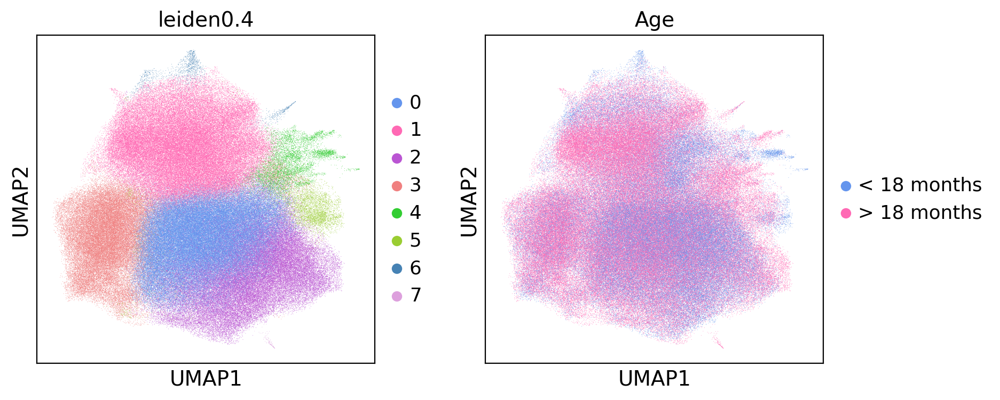

In [5]:
sc.pl.umap(adata, color=['leiden0.4','Age'], palette=my_colors, save='_cluster_age.png')

In [39]:
sc.tl.leiden(adata, resolution=0.4, key_added='leiden0.4')

In [41]:
sc.tl.rank_genes_groups(adata, groupby='leiden0.4', method='wilcoxon', use_raw=False)

In [61]:
markers_df = sc.get.rank_genes_groups_df(adata, group=None)

# Get top 5 per cluster
top_markers_df = markers_df.groupby("group").head(10)

# Extract unique gene names
top_genes = top_markers_df['names'].unique().tolist()

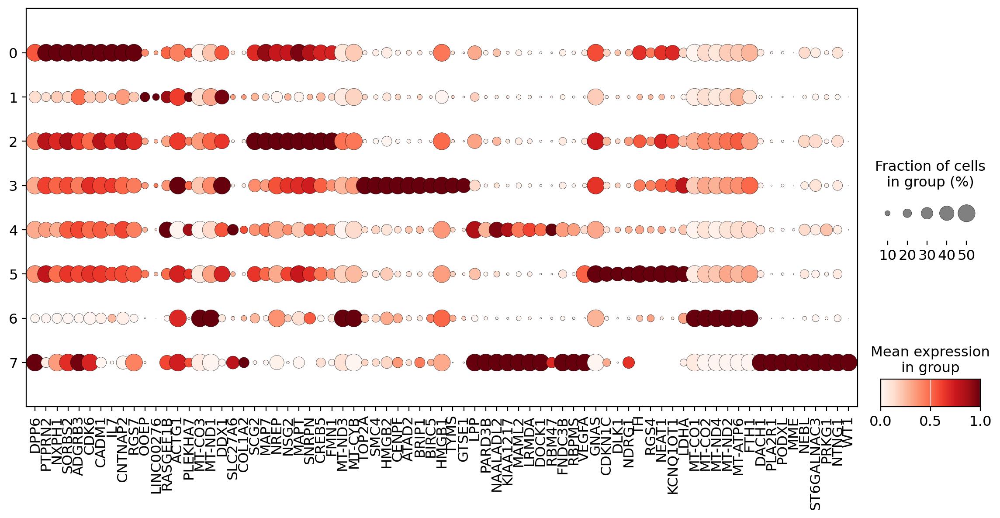

In [68]:
sc.pl.dotplot(
    adata,
    var_names=top_genes,
    groupby='leiden0.4',
    use_raw=False,
    standard_scale='var',  # scales gene expression to 0–1 per gene (optional but common)
    dot_max=0.5,           # adjust as needed
    figsize=(14, 6)
)

In [9]:
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

def add_high_impact_annotations(adata, cluster_col='leiden0.4'):
    """
    Add publication-quality cluster annotations to adata object
    """
    
    print("🏆 Adding High-Impact Publication-Quality Annotations")
    print("=" * 60)
    
    # Define cluster annotations with high-impact naming conventions
    cluster_annotations = {
        # Cluster 0: Neutrophil-guided early neuronal
        '0': {
            'short_name': 'Immature Neuronal',
            'full_name': 'IL7+ Immature Neuronal Progenitors', 
            'publication_name': 'Neutrophil-responsive Neuronal Progenitors',
            'biological_state': 'Early differentiation',
            'neutrophil_response': 'High',
            'age_preference': 'Young-enriched',
            'prognosis': 'Favorable',
            'key_markers': 'IL7, CDK6, DPP6, PTPRN2',
            'functional_program': 'Immune-guided neurogenesis'
        },
        
        # Cluster 1: Transitional stress cells  
        '1': {
            'short_name': 'Transitional Stress',
            'full_name': 'RASGEF1B+ Transitional Cells',
            'publication_name': 'Stress-responsive Transitional State',
            'biological_state': 'Conversion stress',
            'neutrophil_response': 'Low',
            'age_preference': 'Young-depleted', 
            'prognosis': 'Intermediate',
            'key_markers': 'RASGEF1B, ACTG1, MT-genes',
            'functional_program': 'Cellular stress adaptation'
        },
        
        # Cluster 2: Mature neuroendocrine
        '2': {
            'short_name': 'Mature Neuroendocrine',
            'full_name': 'SCG2+ Differentiated Neuroendocrine',
            'publication_name': 'Terminally Differentiated Neuroendocrine Cells',
            'biological_state': 'Terminal differentiation',
            'neutrophil_response': 'High',
            'age_preference': 'Young-enriched',
            'prognosis': 'Favorable',
            'key_markers': 'SCG2, CREB5, MAPT, NSG2',
            'functional_program': 'Mature neuroendocrine function'
        },
        
        # Cluster 3: Aggressive proliferative
        '3': {
            'short_name': 'Cycling Aggressive',
            'full_name': 'TOP2A+ Proliferative Cells',
            'publication_name': 'Hyperproliferative Neutrophil-resistant Cells',
            'biological_state': 'Active proliferation',
            'neutrophil_response': 'Resistant',
            'age_preference': 'Young-depleted',
            'prognosis': 'Poor',
            'key_markers': 'TOP2A, HMGB1, BIRC5, CENPF',
            'functional_program': 'Aggressive cell cycle progression'
        },
        
        # Cluster 4: Mesenchymal-like
        '4': {
            'short_name': 'Mesenchymal-like',
            'full_name': 'DOCK1+ Mesenchymal-like Cells',
            'publication_name': 'Invasive Mesenchymal-like Progenitors',
            'biological_state': 'EMT-like state',
            'neutrophil_response': 'Moderate',
            'age_preference': 'Age-independent',
            'prognosis': 'Intermediate',
            'key_markers': 'DOCK1, PARD3B, RBM47',
            'functional_program': 'Migration and invasion'
        },
        
        # Cluster 5: Classic adrenergic
        '5': {
            'short_name': 'Adrenergic',
            'full_name': 'TH+ Adrenergic Cells',
            'publication_name': 'Classical Adrenergic Neuroblastoma Cells',
            'biological_state': 'Adrenergic differentiation',
            'neutrophil_response': 'Moderate',
            'age_preference': 'Slight young-depletion',
            'prognosis': 'Good',
            'key_markers': 'TH, CDKN1C, VEGFA, NDRG1',
            'functional_program': 'Catecholamine synthesis'
        },
        
        # Cluster 6: Metabolically hyperactive
        '6': {
            'short_name': 'OxPhos High',
            'full_name': 'MT-gene+ Metabolically Active',
            'publication_name': 'Oxidative Phosphorylation-enriched Cells',
            'biological_state': 'Metabolic hyperactivity',
            'neutrophil_response': 'Low',
            'age_preference': 'Slight young-enrichment',
            'prognosis': 'Intermediate',
            'key_markers': 'MT-CO1, MT-CYB, FTH1',
            'functional_program': 'Enhanced mitochondrial respiration'
        },
        
        # Cluster 7: Undifferentiated stem-like
        '7': {
            'short_name': 'Undifferentiated Stem',
            'full_name': 'WT1+ Undifferentiated Cells',
            'publication_name': 'Primitive Neural Crest-like Cancer Stem Cells',
            'biological_state': 'Undifferentiated stemness',
            'neutrophil_response': 'Paradoxical (high receptors)',
            'age_preference': 'Adult-exclusive',
            'prognosis': 'Very Poor',
            'key_markers': 'WT1, DACH1, MME, PLA2R1',
            'functional_program': 'Primitive neural crest program'
        }
    }
    
    # Add different annotation levels to adata.obs
    print("Adding annotation columns to adata.obs...")
    
    # Short names for plotting
    adata.obs['cell_type_short'] = adata.obs[cluster_col].map(
        {k: v['short_name'] for k, v in cluster_annotations.items()}
    )
    
    # Full names for detailed analysis
    adata.obs['cell_type_full'] = adata.obs[cluster_col].map(
        {k: v['full_name'] for k, v in cluster_annotations.items()}
    )
    
    # Publication-quality names (high-impact style)
    adata.obs['cell_type_publication'] = adata.obs[cluster_col].map(
        {k: v['publication_name'] for k, v in cluster_annotations.items()}
    )
    
    # Biological metadata
    adata.obs['biological_state'] = adata.obs[cluster_col].map(
        {k: v['biological_state'] for k, v in cluster_annotations.items()}
    )
    
    adata.obs['neutrophil_response'] = adata.obs[cluster_col].map(
        {k: v['neutrophil_response'] for k, v in cluster_annotations.items()}
    )
    
    adata.obs['age_preference'] = adata.obs[cluster_col].map(
        {k: v['age_preference'] for k, v in cluster_annotations.items()}
    )
    
    adata.obs['prognosis'] = adata.obs[cluster_col].map(
        {k: v['prognosis'] for k, v in cluster_annotations.items()}
    )
    
    # Store detailed annotation information in uns
    adata.uns['cluster_annotations'] = cluster_annotations
    
    print("✓ Added annotation columns:")
    print("  - cell_type_short: Brief names for plots")
    print("  - cell_type_full: Detailed marker-based names") 
    print("  - cell_type_publication: High-impact journal style names")
    print("  - biological_state: Developmental/functional state")
    print("  - neutrophil_response: Response to neutrophil signals")
    print("  - age_preference: Age-related enrichment pattern")
    print("  - prognosis: Clinical outcome association")
    
    # Print summary table
    print(f"\n📋 ANNOTATION SUMMARY TABLE:")
    print("=" * 80)
    
    summary_df = pd.DataFrame.from_dict(cluster_annotations, orient='index')
    summary_df = summary_df.reset_index().rename(columns={'index': 'Cluster'})
    
    # Display key columns
    display_cols = ['Cluster', 'publication_name', 'age_preference', 'prognosis', 'key_markers']
    print(summary_df[display_cols].to_string(index=False))
    
    return adata, cluster_annotations

def create_publication_dotplot(adata, top_genes=None, groupby='cell_type_publication', 
                              figsize=(16, 8), save_name='publication_dotplot'):
    """
    Create publication-quality dotplot with proper annotations
    """
    
    if top_genes is None:
        # Define representative genes for each cluster if not provided
        top_genes = [
            # Cluster 0 - Neutrophil-responsive
            'IL7', 'CDK6', 'DPP6', 'PTPRN2',
            # Cluster 1 - Transitional  
            'RASGEF1B', 'ACTG1', 'PLEKHA7',
            # Cluster 2 - Mature neuroendocrine
            'SCG2', 'CREB5', 'MAPT', 'NSG2',
            # Cluster 3 - Aggressive proliferative
            'TOP2A', 'HMGB1', 'BIRC5', 'CENPF',
            # Cluster 4 - Mesenchymal
            'DOCK1', 'PARD3B', 'RBM47',
            # Cluster 5 - Adrenergic
            'TH', 'CDKN1C', 'VEGFA', 'NDRG1',
            # Cluster 6 - OxPhos
            'MT-CO1', 'MT-CYB', 'FTH1',
            # Cluster 7 - Stem-like
            'WT1', 'DACH1', 'MME', 'PLA2R1'
        ]
        
        # Filter genes present in dataset
        top_genes = [g for g in top_genes if g in adata.var_names]
        print(f"Using {len(top_genes)} representative genes")
    
    # Create the dotplot
    sc.pl.dotplot(
        adata,
        var_names=top_genes,
        groupby=groupby,
        use_raw=False,
        standard_scale='var',
        dot_max=0.6,
        figsize=figsize,
        dendrogram=False,  # Clean look for publication
        save=f'_{save_name}.png'
    )
    
    plt.tight_layout()
    plt.show()

def create_umap_with_annotations(adata, annotation_col='cell_type_publication', 
                               figsize=(12, 8), save_name='annotated_umap'):
    """
    Create publication-quality UMAP with annotations
    """
    
    # Create color palette for cell types
    n_types = len(adata.obs[annotation_col].unique())
    colors = plt.cm.Set3(np.linspace(0, 1, n_types))
    
    sc.pl.umap(adata, 
               color=annotation_col,
               legend_loc='on data',
               legend_fontsize=8,
               legend_fontoutline=2,
               figsize=figsize,
               frameon=False,
               save=f'_{save_name}.png')
    
    plt.show()

def print_annotation_summary(adata):
    """
    Print a comprehensive summary of annotations
    """
    
    print("🧬 NEUROBLASTOMA TUMOR ECOLOGY - FINAL ANNOTATIONS")
    print("=" * 70)
    
    # Cell type counts
    type_counts = adata.obs['cell_type_publication'].value_counts()
    total_cells = len(adata.obs)
    
    print(f"\n📊 CELL TYPE COMPOSITION ({total_cells:,} total cells):")
    print("-" * 50)
    
    for cell_type, count in type_counts.items():
        percentage = (count / total_cells) * 100
        print(f"{cell_type}: {count:,} cells ({percentage:.1f}%)")
    
    # Neutrophil response summary
    print(f"\n🧪 NEUTROPHIL RESPONSE CLASSIFICATION:")
    print("-" * 40)
    
    response_summary = adata.obs.groupby('neutrophil_response')['cell_type_publication'].apply(
        lambda x: list(x.unique())
    )
    
    for response, cell_types in response_summary.items():
        print(f"{response}: {', '.join(cell_types)}")
    
    # Age preference summary  
    print(f"\n👶 AGE PREFERENCE PATTERNS:")
    print("-" * 30)
    
    age_summary = adata.obs.groupby('age_preference')['cell_type_publication'].apply(
        lambda x: list(x.unique())
    )
    
    for age_pref, cell_types in age_summary.items():
        print(f"{age_pref}: {', '.join(cell_types)}")

# Usage example
print("To add high-impact annotations to your adata:")
print("adata, annotations = add_high_impact_annotations(adata, cluster_col='leiden0.4')")
print()
print("To create publication dotplot:")
print("create_publication_dotplot(adata, top_genes=your_gene_list)")
print()
print("To create annotated UMAP:")
print("create_umap_with_annotations(adata)")
print()
print("To print summary:")
print("print_annotation_summary(adata)")

To add high-impact annotations to your adata:
adata, annotations = add_high_impact_annotations(adata, cluster_col='leiden0.4')

To create publication dotplot:
create_publication_dotplot(adata, top_genes=your_gene_list)

To create annotated UMAP:
create_umap_with_annotations(adata)

To print summary:
print_annotation_summary(adata)


Using 29 representative genes


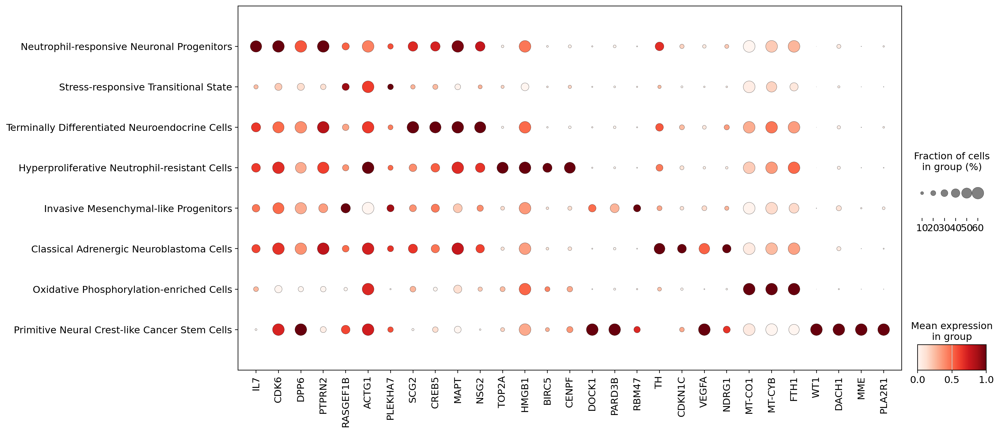

<Figure size 400x400 with 0 Axes>

In [146]:
create_publication_dotplot(adata, top_genes=None)

In [10]:
adata, annotations = add_high_impact_annotations(adata, cluster_col='leiden0.4')

🏆 Adding High-Impact Publication-Quality Annotations
Adding annotation columns to adata.obs...
✓ Added annotation columns:
  - cell_type_short: Brief names for plots
  - cell_type_full: Detailed marker-based names
  - cell_type_publication: High-impact journal style names
  - biological_state: Developmental/functional state
  - neutrophil_response: Response to neutrophil signals
  - age_preference: Age-related enrichment pattern
  - prognosis: Clinical outcome association

📋 ANNOTATION SUMMARY TABLE:
Cluster                               publication_name          age_preference    prognosis                key_markers
      0     Neutrophil-responsive Neuronal Progenitors          Young-enriched    Favorable    IL7, CDK6, DPP6, PTPRN2
      1           Stress-responsive Transitional State          Young-depleted Intermediate  RASGEF1B, ACTG1, MT-genes
      2 Terminally Differentiated Neuroendocrine Cells          Young-enriched    Favorable    SCG2, CREB5, MAPT, NSG2
      3  Hyperprol

In [19]:
print_annotation_summary(adata)

🧬 NEUROBLASTOMA TUMOR ECOLOGY - FINAL ANNOTATIONS

📊 CELL TYPE COMPOSITION (313,637 total cells):
--------------------------------------------------
Neutrophil-responsive Neuronal Progenitors: 93,154 cells (29.7%)
Stress-responsive Transitional State: 88,637 cells (28.3%)
Terminally Differentiated Neuroendocrine Cells: 65,510 cells (20.9%)
Hyperproliferative Neutrophil-resistant Cells: 52,162 cells (16.6%)
Invasive Mesenchymal-like Progenitors: 7,028 cells (2.2%)
Classical Adrenergic Neuroblastoma Cells: 5,484 cells (1.7%)
Oxidative Phosphorylation-enriched Cells: 1,573 cells (0.5%)
Primitive Neural Crest-like Cancer Stem Cells: 89 cells (0.0%)

🧪 NEUTROPHIL RESPONSE CLASSIFICATION:
----------------------------------------
High: Neutrophil-responsive Neuronal Progenitors, Terminally Differentiated Neuroendocrine Cells
Low: Stress-responsive Transitional State, Oxidative Phosphorylation-enriched Cells
Moderate: Classical Adrenergic Neuroblastoma Cells, Invasive Mesenchymal-like Progenit

/tmp/ipykernel_3247929/2897511473.py:271: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  response_summary = adata.obs.groupby('neutrophil_response')['cell_type_publication'].apply(
/tmp/ipykernel_3247929/2897511473.py:282: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  age_summary = adata.obs.groupby('age_preference')['cell_type_publication'].apply(


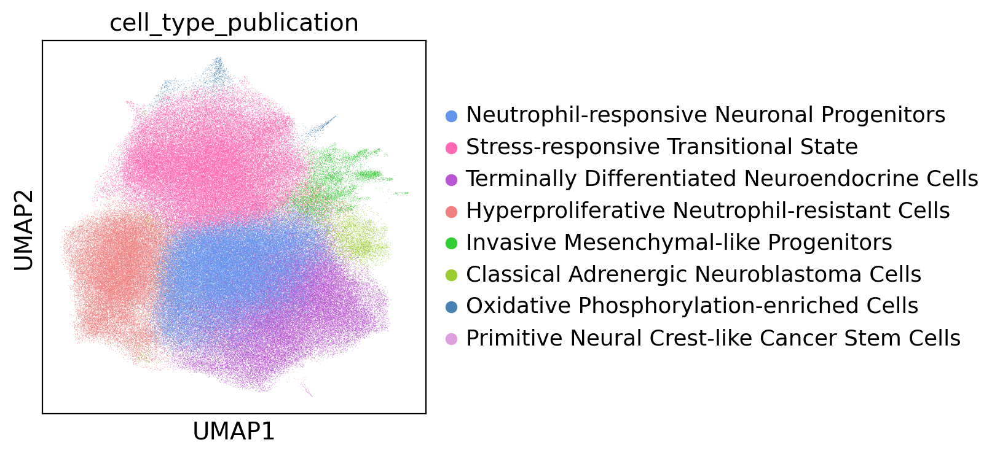

In [18]:
sc.pl.umap(adata, color=['cell_type_publication'], palette=my_colors)

In [20]:
# Extract UMAP coordinates and cluster labels
umap_df = pd.DataFrame(
    adata.obsm["X_umap"],
    columns=["UMAP_1", "UMAP_2"],
    index=adata.obs_names
)

# Add cluster and metadata (e.g., Age)
umap_df["leiden0.4"] = adata.obs["leiden0.4"].values
umap_df["Age"] = adata.obs["Age"].values 
umap_df["cell_type_short"] = adata.obs["cell_type_short"].values 
umap_df["cell_type_full"] = adata.obs["cell_type_full"].values 
umap_df["cell_type_publication"] = adata.obs["cell_type_publication"].values 
umap_df["biological_state"] = adata.obs["biological_state"].values 
umap_df["neutrophil_response"] = adata.obs["neutrophil_response"].values 
umap_df["age_preference"] = adata.obs["age_preference"].values 
umap_df["prognosis"] = adata.obs["prognosis"].values

# Save to CSV
umap_df.to_csv(os.path.join(output_dir, "umap_clusters.csv"))

/tmp/ipykernel_2756053/552466573.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = adata.obs.groupby(["leiden0.4", "Age"]).size().unstack(fill_value=0)


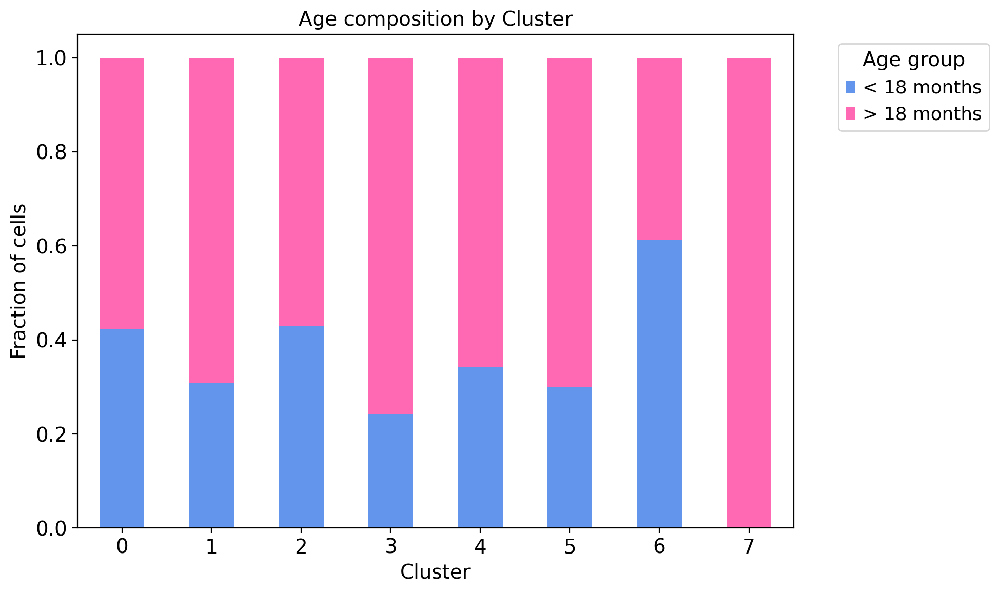

In [79]:
# Step 1: Group by Cluster and Age, reshape to wide format
df = adata.obs.groupby(["leiden0.4", "Age"]).size().unstack(fill_value=0)

# Step 2: Normalize each row to get percentages (each cluster = 100%)
df_percent = df.div(df.sum(axis=1), axis=0)

# Step 3: Define colors for age groups
age_colors = my_colors  # adult, young (or adjust as needed)

# Step 4: Plot
df_percent.plot(
    kind="bar",
    stacked=True,
    color=age_colors,
    figsize=(10, 6)
)
plt.title("Age composition by Cluster")
plt.ylabel("Fraction of cells")
plt.xlabel("Cluster")
plt.xticks(rotation=0)
plt.grid(False)
plt.legend(title="Age group", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("NE_annotation/figures/cluster_composition_by_age.png", dpi=300, bbox_inches="tight")
plt.show()

/tmp/ipykernel_2756053/2339334084.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = adata.obs.groupby(["Age", "leiden0.4"]).size().unstack(fill_value=0)


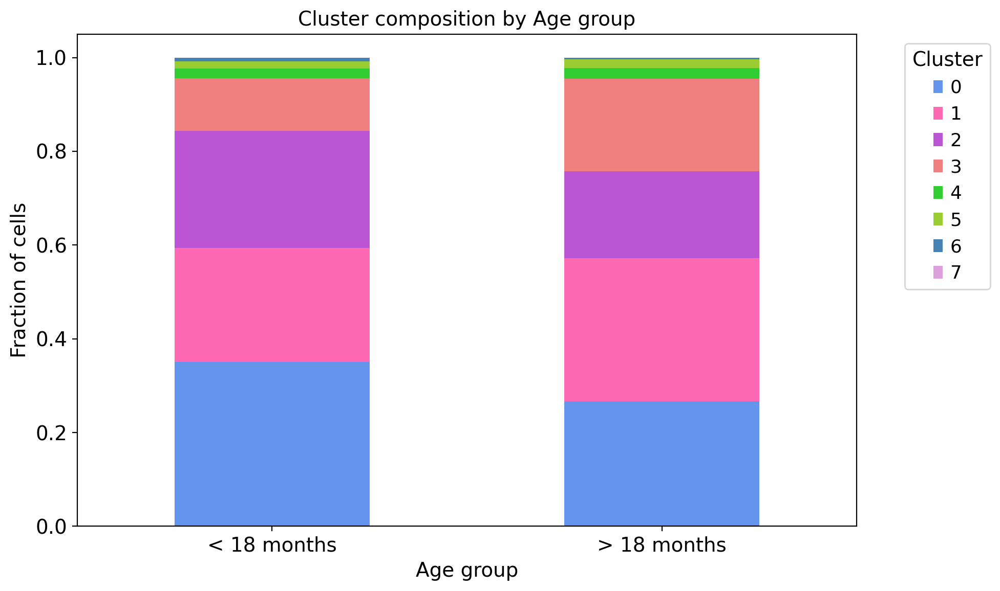

In [80]:
# Step 1: Group by Age and Cluster, reshape to wide format
df = adata.obs.groupby(["Age", "leiden0.4"]).size().unstack(fill_value=0)

# Step 2: Normalize each row to get percentages (each age group = 100%)
df_percent = df.div(df.sum(axis=1), axis=0)

# Step 3: Define colors for clusters
cluster_colors = my_colors

# Step 4: Plot
df_percent.plot(
    kind="bar",
    stacked=True,
    color=cluster_colors[:len(df_percent.columns)],
    figsize=(10, 6)
)
plt.title("Cluster composition by Age group")
plt.ylabel("Fraction of cells")
plt.xlabel("Age group")
plt.xticks(rotation=0)
plt.grid(False)
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("NE_annotation/figures/cluster_composition_by_age2.png", dpi=300, bbox_inches="tight")
plt.show()

In [15]:
props

Age,< 18 months,> 18 months
leiden0.4,,
0,0.423557,0.576443
1,0.307874,0.692126
2,0.428927,0.571073
3,0.241498,0.758502
4,0.341633,0.658367
5,0.300511,0.699489
6,0.612206,0.387794
7,0.000000,1.000000


/tmp/ipykernel_2756053/3254263974.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = adata.obs.groupby(["Age", "leiden0.4"]).size().unstack(fill_value=0)


Cluster composition by age group:
leiden0.4        0      1      2      3      4      5      6    7
Age                                                              
< 18 months  0.351  0.243  0.250  0.112  0.021  0.015  0.009  0.0
> 18 months  0.267  0.305  0.186  0.197  0.023  0.019  0.003  0.0

Differences (Young - Adult):
Cluster 3: -0.085 (↓ LOWER in young)
Cluster 1: -0.062 (↓ LOWER in young)
Cluster 5: -0.004 (↓ LOWER in young)
Cluster 4: -0.002 (↓ LOWER in young)
Cluster 7: -0.000 (↓ LOWER in young)
Cluster 6: +0.006 (↑ HIGHER in young)
Cluster 2: +0.064 (↑ HIGHER in young)
Cluster 0: +0.084 (↑ HIGHER in young)


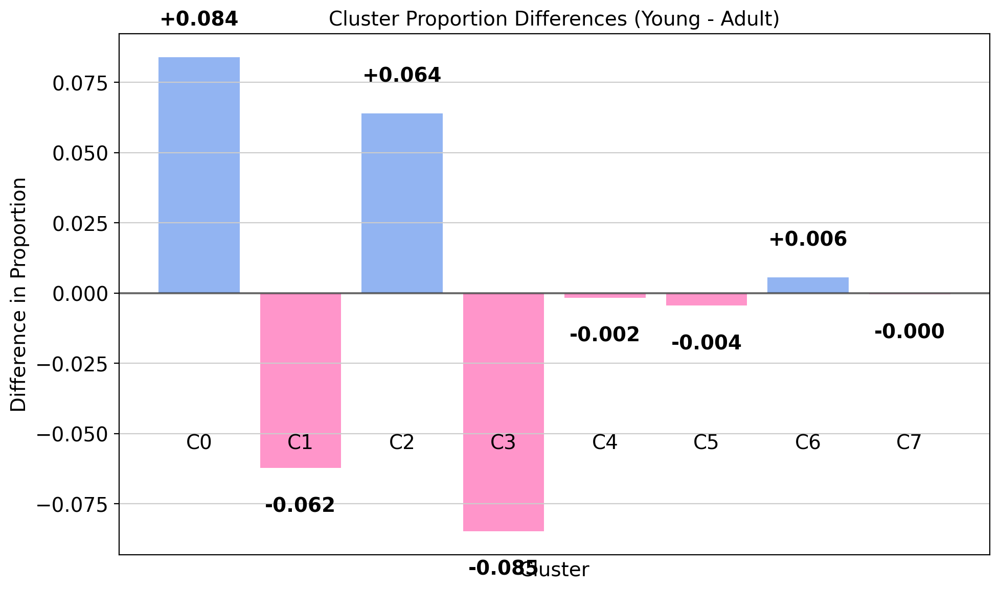


Chi-square test:
Chi2 = 7798.449, p-value = 0.00e+00
✓ SIGNIFICANT difference between age groups

🎯 KEY FINDINGS for Neutrophil Hypothesis:
Most depleted in young (killed by neutrophils):
  Cluster 3: -0.085 (8.5% less in young)
  Cluster 1: -0.062 (6.2% less in young)
  Cluster 5: -0.004 (0.4% less in young)

Most enriched in young (neutrophil-resistant):
  Cluster 0: +0.084 (8.4% more in young)
  Cluster 2: +0.064 (6.4% more in young)
  Cluster 6: +0.006 (0.6% more in young)


In [82]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

# Step 1: Get the distributions
df = adata.obs.groupby(["Age", "leiden0.4"]).size().unstack(fill_value=0)
df_percent = df.div(df.sum(axis=1), axis=0)

print("Cluster composition by age group:")
print(df_percent.round(3))

# Step 2: Calculate differences (Young - Adult)
young_props = df_percent.loc['<18 months'] if '<18 months' in df_percent.index else df_percent.iloc[0]
adult_props = df_percent.loc['>18 months'] if '>18 months' in df_percent.index else df_percent.iloc[1]

differences = young_props - adult_props

print("\nDifferences (Young - Adult):")
for cluster, diff in differences.sort_values().items():
    direction = "↑ HIGHER" if diff > 0 else "↓ LOWER" 
    print(f"Cluster {cluster}: {diff:+.3f} ({direction} in young)")

# Step 3: Plot the differences
plt.figure(figsize=(10, 6))
colors = [my_colors[1] if x < 0 else my_colors[0] for x in differences]
bars = plt.bar(range(len(differences)), differences, color=colors, alpha=0.7)

plt.title("Cluster Proportion Differences (Young - Adult)")
plt.ylabel("Difference in Proportion")
plt.xlabel("Cluster")
plt.axhline(y=0, color='black', linestyle='-', alpha=0.5)

# Add cluster labels and values
for i, (cluster, diff) in enumerate(differences.items()):
    plt.text(i, diff + (0.01 if diff > 0 else -0.01), f'{diff:+.3f}', 
             ha='center', va='bottom' if diff > 0 else 'top', fontweight='bold')
    plt.text(i, -0.05, f'C{cluster}', ha='center', va='top')

plt.xticks([])
plt.tight_layout()
plt.savefig("NE_annotation/figures/cluster_proportions_difference.png", dpi=300, bbox_inches="tight")
plt.show()

# Step 4: Statistical test
chi2, p_value, dof, expected = chi2_contingency(df)
print(f"\nChi-square test:")
print(f"Chi2 = {chi2:.3f}, p-value = {p_value:.2e}")
if p_value < 0.05:
    print("✓ SIGNIFICANT difference between age groups")
else:
    print("✗ No significant difference between age groups")

# Step 5: Identify most important clusters for your hypothesis
print(f"\n🎯 KEY FINDINGS for Neutrophil Hypothesis:")
print(f"Most depleted in young (killed by neutrophils):")
depleted = differences.sort_values().head(3)
for cluster, diff in depleted.items():
    print(f"  Cluster {cluster}: {diff:.3f} ({abs(diff)*100:.1f}% less in young)")

print(f"\nMost enriched in young (neutrophil-resistant):")
enriched = differences.sort_values(ascending=False).head(3)
for cluster, diff in enriched.items():
    print(f"  Cluster {cluster}: {diff:+.3f} ({diff*100:.1f}% more in young)")

In [ ]:
adata.write(f"{output_dir}/annotated_NE.h5ad")

In [4]:
adata = sc.read(f"{output_dir}/annotated_NE.h5ad")

# NicheNet

In [131]:
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr

In [44]:
df = adata.obs.groupby(["Age", "leiden0.4"]).size().unstack(fill_value=0)
df_percent = df.div(df.sum(axis=1), axis=0)
young_props = df_percent.loc['<18 months'] if '<18 months' in df_percent.index else df_percent.iloc[0]
adult_props = df_percent.loc['>18 months'] if '>18 months' in df_percent.index else df_percent.iloc[1]
age_differences = young_props - adult_props

/tmp/ipykernel_3247929/1190951200.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = adata.obs.groupby(["Age", "leiden0.4"]).size().unstack(fill_value=0)


In [45]:
age_differences

leiden0.4
0    0.083957
1   -0.062265
2    0.063919
3   -0.084641
4   -0.001648
5   -0.004412
6    0.005532
7   -0.000442
dtype: float64

In [46]:
top_n = 50
cluster_col='leiden0.4'
min_genes = 5

In [139]:
targets_young = pd.read_csv(OUTNAME+"nichenet_targets_young.csv")['gene'].tolist()
targets_adult = pd.read_csv(OUTNAME+"nichenet_targets_adult.csv")['gene'].tolist()

# Prioritization tables
lr_data = pd.read_csv(OUTNAME+"nichenet_ligand_receptor_prioritization.csv")
lt_data = pd.read_csv(OUTNAME+"nichenet_ligand_target_prioritization.csv")

print(f"✓ Young targets: {len(targets_young)} genes")
print(f"✓ Adult targets: {len(targets_adult)} genes")
print(f"✓ Ligand-receptor pairs: {len(lr_data)} interactions")
print(f"✓ Ligand-target pairs: {len(lt_data)} relationships")

✓ Young targets: 597 genes
✓ Adult targets: 475 genes
✓ Ligand-receptor pairs: 9710 interactions
✓ Ligand-target pairs: 118483 relationships


In [140]:
print("\nExtracting neutrophil interactions...")

# Filter for neutrophil senders
neutrophil_lr = lr_data[lr_data['sender'].str.contains('Neutrophils', na=False)]
neutrophil_lt = lt_data[lt_data['sender'].str.contains('Neutrophils', na=False)]

print(f"Found {len(neutrophil_lr)} neutrophil L-R pairs")
print(f"Found {len(neutrophil_lt)} neutrophil L-T pairs")

# Get top neutrophil ligands
top_ligands = (neutrophil_lr.groupby('ligand')['prioritization_score']
               .max().nlargest(top_n).index.tolist())

# Get receptors for top ligands
top_receptors = (neutrophil_lr[neutrophil_lr['ligand'].isin(top_ligands)]
                 .nlargest(top_n*2, 'prioritization_score')['receptor'].unique().tolist())

# Get target genes for top ligands
target_genes = (neutrophil_lt[neutrophil_lt['ligand'].isin(top_ligands)]
                .nlargest(100, 'activity')['target'].unique().tolist())

print(f"Top neutrophil ligands: {top_ligands[:5]}...")
print(f"Top receptors: {len(top_receptors)} genes")
print(f"Target genes: {len(target_genes)} genes")


Extracting neutrophil interactions...
Found 9710 neutrophil L-R pairs
Found 118483 neutrophil L-T pairs
Top neutrophil ligands: ['IFITM1', 'SELL', 'MMP7', 'SERPING1', 'FCGR3B']...
Top receptors: 67 genes
Target genes: 25 genes


In [141]:
print(f"\nExtracting age-specific neutrophil interactions (top {top_n} each)...")

# Filter for young vs adult neutrophils separately
young_neutrophil_lr = lr_data[lr_data['sender'] == 'Neutrophils_young']
adult_neutrophil_lr = lr_data[lr_data['sender'] == 'Neutrophils_adult']

young_neutrophil_lt = lt_data[lt_data['sender'] == 'Neutrophils_young']
adult_neutrophil_lt = lt_data[lt_data['sender'] == 'Neutrophils_adult']

print(f"Young neutrophil L-R pairs: {len(young_neutrophil_lr)}")
print(f"Adult neutrophil L-R pairs: {len(adult_neutrophil_lr)}")
print(f"Young neutrophil L-T pairs: {len(young_neutrophil_lt)}")
print(f"Adult neutrophil L-T pairs: {len(adult_neutrophil_lt)}")

# Get top ligands for each age group
young_top_ligands = (young_neutrophil_lr.groupby('ligand')['prioritization_score']
                    .max().nlargest(top_n).index.tolist())

adult_top_ligands = (adult_neutrophil_lr.groupby('ligand')['prioritization_score']
                    .max().nlargest(top_n).index.tolist())

# Get receptors for each age group's top ligands
young_receptors = (young_neutrophil_lr[young_neutrophil_lr['ligand'].isin(young_top_ligands)]
                  .nlargest(top_n*2, 'prioritization_score')['receptor'].unique().tolist())

adult_receptors = (adult_neutrophil_lr[adult_neutrophil_lr['ligand'].isin(adult_top_ligands)]
                  .nlargest(top_n*2, 'prioritization_score')['receptor'].unique().tolist())

# Get target genes for each age group
young_target_genes = (young_neutrophil_lt[young_neutrophil_lt['ligand'].isin(young_top_ligands)]
                     .nlargest(100, 'activity')['target'].unique().tolist())

adult_target_genes = (adult_neutrophil_lt[adult_neutrophil_lt['ligand'].isin(adult_top_ligands)]
                     .nlargest(100, 'activity')['target'].unique().tolist())

# Compare young vs adult
young_specific_ligands = set(young_top_ligands) - set(adult_top_ligands)
adult_specific_ligands = set(adult_top_ligands) - set(young_top_ligands)
shared_ligands = set(young_top_ligands).intersection(set(adult_top_ligands))

print(f"\n🔍 AGE-SPECIFIC LIGAND COMPARISON:")
print(f"Young-specific ligands ({len(young_specific_ligands)}): {list(young_specific_ligands)[:5]}...")
print(f"Adult-specific ligands ({len(adult_specific_ligands)}): {list(adult_specific_ligands)[:5]}...")
print(f"Shared ligands ({len(shared_ligands)}): {list(shared_ligands)}")


Extracting age-specific neutrophil interactions (top 50 each)...
Young neutrophil L-R pairs: 4855
Adult neutrophil L-R pairs: 4855
Young neutrophil L-T pairs: 69644
Adult neutrophil L-T pairs: 48839

🔍 AGE-SPECIFIC LIGAND COMPARISON:
Young-specific ligands (50): ['JAML', 'SIGLEC12', 'S100A9', 'SERPING1', 'CKLF']...
Adult-specific ligands (50): ['MMP7', 'NPB', 'CXCL3', 'TSPAN33', 'CD209']...
Shared ligands (0): []


In [87]:
receptors = (young_neutrophil_lr['receptor'].unique().tolist())

In [90]:
len(receptors)

1042

In [143]:
print(f"\nScoring clusters for age-specific neutrophil interactions...")

def filter_present_genes(gene_list, adata, name):
    present = [g for g in gene_list if g in adata.var_names]
    print(f"  {name}: {len(present)}/{len(gene_list)} genes present")
    return present

# Score for NicheNet young/adult targets (original)
targets_young_present = filter_present_genes(targets_young, adata, "NicheNet young targets")
targets_adult_present = filter_present_genes(targets_adult, adata, "NicheNet adult targets")

# Score for age-specific neutrophil interactions
young_receptors = filter_present_genes(young_receptors, adata, "Young neutrophil receptors")
adult_receptors = filter_present_genes(adult_receptors, adata, "Adult neutrophil receptors")

young_targets = filter_present_genes(young_target_genes, adata, "Young neutrophil targets")
adult_targets = filter_present_genes(adult_target_genes, adata, "Adult neutrophil targets")

# Score cells
score_info = {}

if len(targets_young_present) >= min_genes:
    sc.tl.score_genes(adata, targets_young_present, score_name='nichenet_young_targets')
    score_info['nichenet_young_targets'] = len(targets_young_present)

if len(targets_adult_present) >= min_genes:
    sc.tl.score_genes(adata, targets_adult_present, score_name='nichenet_adult_targets')
    score_info['nichenet_adult_targets'] = len(targets_adult_present)
    
if len(young_receptors) >= min_genes:
    sc.tl.score_genes(adata, young_receptors, score_name='young_neutrophil_receptors')
    score_info['young_neutrophil_receptors'] = len(young_receptors)
    
if len(adult_receptors) >= min_genes:
    sc.tl.score_genes(adata, adult_receptors, score_name='adult_neutrophil_receptors')
    score_info['adult_neutrophil_receptors'] = len(adult_receptors)
    
if len(young_targets) >= min_genes:
    sc.tl.score_genes(adata, young_targets, score_name='young_neutrophil_targets')
    score_info['young_neutrophil_targets'] = len(young_targets)
    
if len(adult_targets) >= min_genes:
    sc.tl.score_genes(adata, adult_targets, score_name='adult_neutrophil_targets')
    score_info['adult_neutrophil_targets'] = len(adult_targets)
    

# Calculate cluster means
score_cols = [col for col in adata.obs.columns if any(x in col for x in ['nichenet', 'neutrophil'])]
numeric_cols = [col for col in score_cols if pd.api.types.is_numeric_dtype(adata.obs[col])]

# Вычисляем среднее
# adata.obs.groupby(cluster_col, observed=False)[numeric_cols].mean()
cluster_scores = adata.obs.groupby(cluster_col)[numeric_cols].mean()

print(f"\nAvailable scores: {score_cols}")
print("Genes used for each score:")
for score, n_genes in score_info.items():
    print(f"  {score}: {n_genes} genes")


Scoring clusters for age-specific neutrophil interactions...
  NicheNet young targets: 285/597 genes present
  NicheNet adult targets: 234/475 genes present
  Young neutrophil receptors: 41/70 genes present
  Adult neutrophil receptors: 28/63 genes present
  Young neutrophil targets: 21/34 genes present
  Adult neutrophil targets: 5/10 genes present

Available scores: ['neutrophil_response', 'nichenet_young_targets', 'nichenet_adult_targets', 'young_neutrophil_receptors', 'adult_neutrophil_receptors', 'young_neutrophil_targets', 'adult_neutrophil_targets', 'nichenet_young_targets_optimized', 'neutrophil_receptors_filtered', 'neutrophil_targets_filtered']
Genes used for each score:
  nichenet_young_targets: 285 genes
  nichenet_adult_targets: 234 genes
  young_neutrophil_receptors: 41 genes
  adult_neutrophil_receptors: 28 genes
  young_neutrophil_targets: 21 genes
  adult_neutrophil_targets: 5 genes


/tmp/ipykernel_3247929/2861777338.py:53: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata.obs.groupby(cluster_col)[numeric_cols].mean()


In [144]:
cluster_scores

,nichenet_young_targets,nichenet_adult_targets,young_neutrophil_receptors,adult_neutrophil_receptors,young_neutrophil_targets,adult_neutrophil_targets,nichenet_young_targets_optimized,neutrophil_receptors_filtered,neutrophil_targets_filtered
leiden0.4,,,,,,,,,
0,0.247233,0.214522,0.243567,0.195675,0.081684,0.121757,1.086171,0.704480,0.675096
1,0.101255,0.119918,0.085005,0.045305,-0.006299,0.112535,0.334206,0.254923,0.083091
2,0.226390,0.201781,0.233713,0.145075,0.074351,0.151351,0.867096,0.599824,0.559985
3,0.048919,0.078713,0.104697,0.012841,-0.043591,0.185256,0.331841,0.219570,0.018209
4,0.121573,0.137587,0.170082,0.172582,0.102850,0.404871,0.444098,0.436170,0.214135
5,0.100533,0.069267,0.108422,0.020216,0.009308,0.043387,0.470458,0.394482,0.164272
6,0.036035,-0.004088,0.009920,-0.079491,-0.090325,0.050092,-0.205947,0.045758,-0.201711
7,0.056970,0.102626,0.486212,0.457054,-0.090225,0.284287,-0.336268,0.595252,0.018776


In [133]:
import pandas as pd
import numpy as np
import scanpy as sc
from scipy import stats
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

def calculate_gene_discrimination_score(adata, gene_list, cluster_col, 
                                      high_clusters=[0, 2], low_clusters=[1, 3]):
    """
    Calculate how well each gene discriminates between target cluster groups
    """
    gene_scores = {}
    
    for gene in gene_list:
        if gene not in adata.var_names:
            continue
            
        # Get expression values for this gene
        gene_expr = adata[:, gene].X.toarray().flatten() if hasattr(adata.X, 'toarray') else adata[:, gene].X.flatten()
        
        # Get cluster assignments
        clusters = adata.obs[cluster_col].astype(str)
        
        # Calculate mean expression in high vs low target clusters
        high_mask = clusters.isin([str(c) for c in high_clusters])
        low_mask = clusters.isin([str(c) for c in low_clusters])
        
        if high_mask.sum() == 0 or low_mask.sum() == 0:
            gene_scores[gene] = 0
            continue
            
        high_expr = gene_expr[high_mask]
        low_expr = gene_expr[low_mask]
        
        # Calculate discrimination score (difference in means / pooled std)
        mean_diff = np.mean(high_expr) - np.mean(low_expr)
        pooled_std = np.sqrt((np.var(high_expr) + np.var(low_expr)) / 2)
        
        if pooled_std == 0:
            discrimination_score = 0
        else:
            discrimination_score = mean_diff / pooled_std
            
        gene_scores[gene] = discrimination_score
    
    return gene_scores

def optimize_gene_signature(adata, initial_genes, cluster_col, 
                          high_clusters=[0, 2], low_clusters=[1, 3],
                          min_genes=10, score_name='optimized_young_targets'):
    """
    Optimize gene signature by iteratively removing genes that hurt discrimination
    """
    
    # Filter genes present in data
    present_genes = [g for g in initial_genes if g in adata.var_names]
    print(f"Starting with {len(present_genes)} genes present in data")
    
    if len(present_genes) < min_genes:
        print(f"Not enough genes present ({len(present_genes)} < {min_genes})")
        return present_genes, {}
    
    # Calculate initial gene discrimination scores
    gene_scores = calculate_gene_discrimination_score(
        adata, present_genes, cluster_col, high_clusters, low_clusters
    )
    
    # Sort genes by discrimination score (descending)
    sorted_genes = sorted(gene_scores.items(), key=lambda x: x[1], reverse=True)
    
    print("\nTop 10 discriminating genes:")
    for gene, score in sorted_genes[:10]:
        print(f"  {gene}: {score:.3f}")
    
    print("\nBottom 10 discriminating genes:")
    for gene, score in sorted_genes[-10:]:
        print(f"  {gene}: {score:.3f}")
    
    # Remove genes with negative discrimination scores
    positive_genes = [gene for gene, score in sorted_genes if score > 0]
    
    print(f"\nFiltered to {len(positive_genes)} genes with positive discrimination scores")
    
    # Iterative optimization
    best_genes = positive_genes.copy()
    best_score_diff = -np.inf
    
    for n_genes in range(min(len(positive_genes), 100), min_genes-1, -5):  # Test different gene set sizes
        if n_genes >= len(positive_genes):
            continue
            
        # Take top n_genes
        current_genes = [gene for gene, _ in sorted_genes[:n_genes] if gene in positive_genes]
        
        if len(current_genes) < min_genes:
            break
            
        # Calculate score with current gene set
        sc.tl.score_genes(adata, current_genes, score_name=f'temp_{score_name}')
        
        # Calculate cluster-specific scores
        cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()
        
        # Calculate discrimination metric
        high_mean = cluster_means[[str(c) for c in high_clusters]].mean()
        low_mean = cluster_means[[str(c) for c in low_clusters]].mean()
        score_diff = high_mean - low_mean
        
        print(f"n_genes={n_genes}: high_mean={high_mean:.3f}, low_mean={low_mean:.3f}, diff={score_diff:.3f}")
        
        if score_diff > best_score_diff:
            best_score_diff = score_diff
            best_genes = current_genes.copy()
        
        # Clean up temporary score
        if f'temp_{score_name}' in adata.obs.columns:
            adata.obs.drop(columns=[f'temp_{score_name}'], inplace=True)
    
    print(f"\nOptimal gene set size: {len(best_genes)} genes")
    print(f"Best discrimination score: {best_score_diff:.3f}")
    
    return best_genes, gene_scores

def compare_signatures(adata, original_genes, optimized_genes, cluster_col,
                      high_clusters=[0, 2], low_clusters=[1, 3]):
    """
    Compare original vs optimized gene signatures
    """
    results = {}
    
    for name, genes in [('Original', original_genes), ('Optimized', optimized_genes)]:
        present_genes = [g for g in genes if g in adata.var_names]
        
        if len(present_genes) >= 10:  # min_genes
            score_name = f'{name.lower()}_score'
            sc.tl.score_genes(adata, present_genes, score_name=score_name)
            
            cluster_means = adata.obs.groupby(cluster_col)[score_name].mean()
            
            high_mean = cluster_means[[str(c) for c in high_clusters]].mean()
            low_mean = cluster_means[[str(c) for c in low_clusters]].mean()
            
            results[name] = {
                'n_genes': len(present_genes),
                'high_mean': high_mean,
                'low_mean': low_mean,
                'discrimination': high_mean - low_mean,
                'cluster_scores': cluster_means.to_dict()
            }
    
    return results

# Main optimization function
def optimize_young_targets_score(adata, targets_young_present, cluster_col='leiden0.4',
                               min_genes=10):
    """
    Main function to optimize the young targets gene signature
    """
    print("=== Optimizing Young Targets Gene Signature ===")
    
    # Step 1: Optimize gene signature
    optimized_genes, gene_scores = optimize_gene_signature(
        adata, targets_young_present, cluster_col,
        high_clusters=[0, 2], low_clusters=[1, 3], min_genes=min_genes
    )
    
    # Step 2: Calculate final optimized score
    if len(optimized_genes) >= min_genes:
        sc.tl.score_genes(adata, optimized_genes, score_name='nichenet_young_targets_optimized')
    
    # Step 3: Compare signatures
    comparison = compare_signatures(
        adata, targets_young_present, optimized_genes, cluster_col
    )
    
    # Step 4: Display results
    print("\n=== Comparison Results ===")
    for name, stats in comparison.items():
        print(f"\n{name} Signature:")
        print(f"  Genes: {stats['n_genes']}")
        print(f"  High clusters (0,2) mean: {stats['high_mean']:.3f}")
        print(f"  Low clusters (1,3) mean: {stats['low_mean']:.3f}")
        print(f"  Discrimination: {stats['discrimination']:.3f}")
        print("  Per-cluster scores:")
        for cluster, score in stats['cluster_scores'].items():
            print(f"    Cluster {cluster}: {score:.3f}")
    
    return optimized_genes, gene_scores, comparison

# Additional utility function for detailed gene analysis
def analyze_problematic_genes(adata, gene_scores, targets_young_present, 
                            cluster_col='leiden0.4', n_worst=10):
    """
    Analyze the worst-performing genes in detail
    """
    print(f"\n=== Analysis of {n_worst} Most Problematic Genes ===")
    
    # Get worst genes
    sorted_genes = sorted(gene_scores.items(), key=lambda x: x[1])
    worst_genes = [gene for gene, score in sorted_genes[:n_worst]]
    
    for gene in worst_genes:
        if gene not in adata.var_names:
            continue
            
        gene_expr = adata[:, gene].X.toarray().flatten() if hasattr(adata.X, 'toarray') else adata[:, gene].X.flatten()
        cluster_means = adata.obs.groupby(cluster_col).apply(
            lambda x: gene_expr[x.index].mean()
        )
        
        print(f"\n{gene} (discrimination score: {gene_scores[gene]:.3f}):")
        for cluster, mean_expr in cluster_means.items():
            print(f"  Cluster {cluster}: {mean_expr:.3f}")

# Example usage:
"""
# Run the optimization
optimized_genes, gene_scores, comparison = optimize_young_targets_score(
    adata, targets_young_present, cluster_col='leiden0.4'
)

# Analyze problematic genes
analyze_problematic_genes(adata, gene_scores, targets_young_present)

# Use optimized genes for scoring
if len(optimized_genes) >= min_genes:
    sc.tl.score_genes(adata, optimized_genes, score_name='nichenet_young_targets_optimized')
    score_info['nichenet_young_targets_optimized'] = len(optimized_genes)
"""

"\n# Run the optimization\noptimized_genes, gene_scores, comparison = optimize_young_targets_score(\n    adata, targets_young_present, cluster_col='leiden0.4'\n)\n\n# Analyze problematic genes\nanalyze_problematic_genes(adata, gene_scores, targets_young_present)\n\n# Use optimized genes for scoring\nif len(optimized_genes) >= min_genes:\n    sc.tl.score_genes(adata, optimized_genes, score_name='nichenet_young_targets_optimized')\n    score_info['nichenet_young_targets_optimized'] = len(optimized_genes)\n"

In [ ]:
ptimized_genes, gene_scores, comparison = optimize_young_targets_score(
    adata, targets_young_present, cluster_col='leiden0.4', min_genes=min_genes
)

# The optimized score will be stored as 'nichenet_young_targets_optimized'
if 'nichenet_young_targets_optimized' in adata.obs.columns:
    score_info['nichenet_young_targets_optimized'] = len(ptimized_genes)

=== Optimizing Young Targets Gene Signature ===
Starting with 351 genes present in data


In [86]:
comparison

{'Original': {'n_genes': 351,
  'high_mean': 0.33400332093174734,
  'low_mean': 0.03368575168726055,
  'discrimination': 0.30031756924448677,
  'cluster_scores': {'0': 0.3567214115993063,
   '1': 0.05010996819531274,
   '2': 0.3112852302641883,
   '3': 0.017261535179208348,
   '4': 0.15966550607987914,
   '5': 0.14522447651384462,
   '6': -0.10351807859673876,
   '7': 0.16984981647686218}},
 'Optimized': {'n_genes': 10,
  'high_mean': 0.855129935763671,
  'low_mean': 0.18594170283150707,
  'discrimination': 0.6691882329321639,
  'cluster_scores': {'0': 0.9262032170715792,
   '1': 0.1701255503199926,
   '2': 0.7840566544557628,
   '3': 0.2017578553430215,
   '4': 0.30411704995288447,
   '5': 0.48030998444997486,
   '6': -0.1621877082459074,
   '7': -0.15796675354343578}}}

In [85]:
gene_scores

{'HDAC2-AS2': 0.397948555314582,
 'NREP-AS1': 0.41881189222150944,
 'GRID2': 0.39945567826213324,
 'NTRK1': 0.48878937821263907,
 'SLC18A1': 0.3502980788463272,
 'EPHA5': 0.47939866646741675,
 'ANKFN1': 0.5254268947511259,
 'MIR137HG': 0.46874061076342866,
 'SFRP1': 0.2887330809988479,
 'PLXNA4': 0.5205874281944626,
 'RAPGEF5': 0.37429686162774006,
 'HES4': 0.11242435378512013,
 'MAP7': 0.7444472927523138,
 'ANXA2': 0.2342448312273324,
 'TMEFF2': 0.5249455077545166,
 'LAMA4': 0.23274627492497418,
 'LDB2': 0.11672194672691825,
 'TMEM163': 0.29288270702081315,
 'CASC15': 0.433876371950875,
 'ECEL1': 0.3689030788040588,
 'CCBE1': 0.4462237848991586,
 'UTY': 0.24744376727654072,
 'VWDE': 0.34939911260321094,
 'ARL17B': 0.18429510486905767,
 'NLGN4Y': 0.2581071842717033,
 'CDH6': 0.2915528905352355,
 'EPB41L4A': 0.4421143330226176,
 'CDH12': 0.4048009338982975,
 'ALCAM': 0.5518088440332076,
 'SNTG2': 0.3688977429200406,
 'RBMS3-AS2': 0.4698720306476146,
 'ATP2B4': 0.553748305594138,
 'CPNE8

In [59]:
ptimized_genes

['MAP7',
 'SORBS2',
 'MAPT',
 'PCLO',
 'PTPRN2',
 'SCN9A',
 'CADM1',
 'PRUNE2',
 'ADGRB3-DT',
 'CNTNAP2']

In [57]:
numeric_cols = ['nichenet_young_targets_optimized', 'original_score', 'optimized_score']

adata.obs.groupby(cluster_col)[numeric_cols].mean()

/tmp/ipykernel_3247929/3787038459.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby(cluster_col)[numeric_cols].mean()


,nichenet_young_targets_optimized,original_score,optimized_score
leiden0.4,,,
0,0.926203,0.356721,0.926203
1,0.170126,0.050110,0.170126
2,0.784057,0.311285,0.784057
3,0.201758,0.017262,0.201758
4,0.304117,0.159666,0.304117
5,0.480310,0.145224,0.480310
6,-0.162188,-0.103518,-0.162188
7,-0.157967,0.169850,-0.157967


In [91]:
optimized_genes_rec, gene_scores_rec, comparison_rec = optimize_young_targets_score(
    adata, receptors, cluster_col='leiden0.4', min_genes=min_genes
)

# The optimized score will be stored as 'nichenet_young_targets_optimized'
if 'nichenet_young_targets_optimized' in adata.obs.columns:
    score_info['nichenet_young_targets_optimized'] = len(ptimized_genes)

=== Optimizing Young Targets Gene Signature ===
Starting with 465 genes present in data

Top 10 discriminating genes:
  SCN9A: 0.661
  CADM1: 0.629
  CNTNAP2: 0.587
  CHRNA7: 0.566
  NCAM1: 0.564
  ALCAM: 0.552
  PLXNA4: 0.521
  NRXN1: 0.500
  NTRK1: 0.489
  EPHA5: 0.479

Bottom 10 discriminating genes:
  KDR: -0.060
  PLVAP: -0.076
  ADGRL4: -0.077
  CALCRL: -0.081
  CD93: -0.086
  FLT1: -0.092
  TNFRSF13C: -0.092
  CXCR4: -0.093
  PECAM1: -0.101
  HMMR: -0.245

Filtered to 274 genes with positive discrimination scores


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=100: high_mean=0.341, low_mean=0.109, diff=0.232


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=95: high_mean=0.344, low_mean=0.107, diff=0.238


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=90: high_mean=0.372, low_mean=0.123, diff=0.249


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=85: high_mean=0.394, low_mean=0.132, diff=0.262


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=80: high_mean=0.365, low_mean=0.102, diff=0.263


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=75: high_mean=0.394, low_mean=0.117, diff=0.277


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=70: high_mean=0.351, low_mean=0.082, diff=0.269


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=65: high_mean=0.399, low_mean=0.112, diff=0.287


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=60: high_mean=0.440, low_mean=0.133, diff=0.307


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=55: high_mean=0.494, low_mean=0.165, diff=0.329


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=50: high_mean=0.552, low_mean=0.201, diff=0.352


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=45: high_mean=0.567, low_mean=0.190, diff=0.377


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=40: high_mean=0.644, low_mean=0.239, diff=0.405


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=35: high_mean=0.628, low_mean=0.202, diff=0.426


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=30: high_mean=0.422, low_mean=0.018, diff=0.404


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=25: high_mean=0.521, low_mean=0.079, diff=0.441


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=20: high_mean=0.639, low_mean=0.157, diff=0.482


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=15: high_mean=0.691, low_mean=0.161, diff=0.531


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=10: high_mean=0.764, low_mean=0.221, diff=0.543


/tmp/ipykernel_3247929/1617077548.py:104: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[f'temp_{score_name}'].mean()


n_genes=5: high_mean=0.977, low_mean=0.333, diff=0.644

Optimal gene set size: 5 genes
Best discrimination score: 0.644

=== Comparison Results ===

Original Signature:
  Genes: 465
  High clusters (0,2) mean: -0.008
  Low clusters (1,3) mean: -0.041
  Discrimination: 0.033
  Per-cluster scores:
    Cluster 0: -0.006
    Cluster 1: -0.010
    Cluster 2: -0.011
    Cluster 3: -0.072
    Cluster 4: 0.002
    Cluster 5: -0.038
    Cluster 6: -0.053
    Cluster 7: 0.062


/tmp/ipykernel_3247929/1617077548.py:140: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata.obs.groupby(cluster_col)[score_name].mean()


In [92]:
numeric_cols = ['nichenet_young_targets_optimized', 'original_score', 'optimized_score']

adata.obs.groupby(cluster_col)[numeric_cols].mean()

/tmp/ipykernel_3247929/3787038459.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby(cluster_col)[numeric_cols].mean()


,nichenet_young_targets_optimized,original_score,optimized_score
leiden0.4,,,
0,1.086171,-0.005759,0.926203
1,0.334206,-0.010429,0.170126
2,0.867096,-0.010741,0.784057
3,0.331841,-0.072296,0.201758
4,0.444098,0.001653,0.304117
5,0.470458,-0.038068,0.480310
6,-0.205947,-0.052846,-0.162188
7,-0.336268,0.062388,-0.157967


In [95]:
comparison_rec

{'Original': {'n_genes': 465,
  'high_mean': -0.008249905701057453,
  'low_mean': -0.041362560415013586,
  'discrimination': 0.033112654713956136,
  'cluster_scores': {'0': -0.005758932500374516,
   '1': -0.010428772600898105,
   '2': -0.010740878901740393,
   '3': -0.07229634822912906,
   '4': 0.0016530352732060452,
   '5': -0.038068123958327364,
   '6': -0.052846000518367645,
   '7': 0.06238799147784408}}}

In [112]:
targets_genes_score = {gene: value for gene, value in gene_scores.items() if value > 0.5}

In [116]:
receptors_genes_score = {gene: value for gene, value in gene_scores_rec.items() if value > 0.3}

In [123]:
sc.tl.score_genes(adata, list(receptors_genes_score.keys()), score_name='neutrophil_receptors_filtered')
score_info['neutrophil_receptors_filtered'] = len(list(receptors_genes_score.keys()))

In [113]:
targets_genes_score

{'ANKFN1': 0.5254268947511259,
 'PLXNA4': 0.5205874281944626,
 'MAP7': 0.7444472927523138,
 'TMEFF2': 0.5249455077545166,
 'ALCAM': 0.5518088440332076,
 'ATP2B4': 0.553748305594138,
 'SCG2': 0.5565760375537461,
 'DLC1': 0.5045031377104867,
 'TIMP3': 0.5256250658033449,
 'PRUNE2': 0.5993234034756406,
 'CHRNA7': 0.5662631714358498,
 'NXPH1': 0.5529385266057073,
 'SOX6': 0.5603650027414463,
 'CADM1': 0.6291681193499149,
 'NREP': 0.5341601026175948,
 'ARHGAP26': 0.5091529838727052,
 'PCLO': 0.6737701224898186,
 'SCN9A': 0.661412213644563,
 'ADGRB3-DT': 0.5878783041184007,
 'IL7': 0.5097301275711891,
 'NCAM1': 0.5637102432490602,
 'RGS7': 0.538756868349425,
 'EBF1': 0.5763605399984761,
 'FMN1': 0.5029165369499535,
 'TMOD1': 0.5767434662276916,
 'HS6ST3': 0.5348755975127848,
 'TSHZ2': 0.5358134773750532,
 'TLN2': 0.540268492115303,
 'MAPT': 0.6999696577038993,
 'PTPRN2': 0.6666629771731083,
 'EXOC4': 0.5323450077929888,
 'SORBS2': 0.7016551025566667,
 'CNTNAP2': 0.5869417679486617,
 'SNRPN':

In [126]:
sc.tl.score_genes(adata, list(targets_genes_score.keys()), score_name='neutrophil_targets_filtered')
score_info['neutrophil_targets_filtered'] = len(list(targets_genes_score.keys()))

In [117]:
receptors_genes_score

{'UNC5D': 0.408166167223124,
 'RAMP1': 0.3154950787518328,
 'LIFR': 0.32685331072235563,
 'NTRK1': 0.48878937821263907,
 'CD44': 0.4143515883409255,
 'NCAM1': 0.5637102432490602,
 'CADM1': 0.6291681193499149,
 'ITGB8': 0.3631835529395741,
 'NTRK3': 0.3146374594270029,
 'ALCAM': 0.5518088440332076,
 'NEGR1': 0.36180397597478925,
 'CNTN1': 0.4480267209449572,
 'LRRC4C': 0.3337763405567205,
 'EPHA5': 0.47939866646741675,
 'NEO1': 0.30909459708286047,
 'PLXNA4': 0.5205874281944626,
 'EPHA6': 0.3569175503989283,
 'NRP1': 0.33567025817603713,
 'CHRNA7': 0.5662631714358498,
 'BMPR1B': 0.40103763959079164,
 'DCC': 0.3572372136550177,
 'NRXN1': 0.5004733810992459,
 'ROBO2': 0.3316017794154445,
 'CHRNA3': 0.37177064886425765,
 'GNAS': 0.304117916163351,
 'RTN4': 0.391407469746434,
 'SCN9A': 0.661412213644563,
 'NCAM2': 0.36685487309307024,
 'SORCS1': 0.35544762533355534,
 'CAMK2A': 0.3180597243508089,
 'NLGN1': 0.3519814588516232,
 'CCBE1': 0.4462237848991586,
 'CNTNAP2': 0.5869417679486617,
 'L

In [127]:
numeric_cols = ['neutrophil_targets_filtered', 'neutrophil_receptors_filtered']

adata.obs.groupby(cluster_col)[numeric_cols].mean()

/tmp/ipykernel_3247929/2958161933.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby(cluster_col)[numeric_cols].mean()


,neutrophil_targets_filtered,neutrophil_receptors_filtered
leiden0.4,,
0,0.675096,0.704480
1,0.083091,0.254923
2,0.559985,0.599824
3,0.018209,0.219570
4,0.214135,0.436170
5,0.164272,0.394482
6,-0.201711,0.045758
7,0.018776,0.595252


In [147]:
cluster_scores

,nichenet_young_targets,nichenet_adult_targets,young_neutrophil_receptors,adult_neutrophil_receptors,young_neutrophil_targets,adult_neutrophil_targets,nichenet_young_targets_optimized,neutrophil_receptors_filtered,neutrophil_targets_filtered
leiden0.4,,,,,,,,,
0,0.247233,0.214522,0.243567,0.195675,0.081684,0.121757,1.086171,0.704480,0.675096
1,0.101255,0.119918,0.085005,0.045305,-0.006299,0.112535,0.334206,0.254923,0.083091
2,0.226390,0.201781,0.233713,0.145075,0.074351,0.151351,0.867096,0.599824,0.559985
3,0.048919,0.078713,0.104697,0.012841,-0.043591,0.185256,0.331841,0.219570,0.018209
4,0.121573,0.137587,0.170082,0.172582,0.102850,0.404871,0.444098,0.436170,0.214135
5,0.100533,0.069267,0.108422,0.020216,0.009308,0.043387,0.470458,0.394482,0.164272
6,0.036035,-0.004088,0.009920,-0.079491,-0.090325,0.050092,-0.205947,0.045758,-0.201711
7,0.056970,0.102626,0.486212,0.457054,-0.090225,0.284287,-0.336268,0.595252,0.018776


In [177]:
young_scores

Tumor_71_dong_Tumor_71_dong_ACACCAAAGCTGTCTA.1                  0.138984
Tumor_71_dong_Tumor_71_dong_TCTGGAAGTTCCGGCA.1                  0.080096
NB26_verhoeven_NB26_verhoeven_NB26_ACGGAGAGTCTTGTCC-1           0.143016
NB26_verhoeven_NB26_verhoeven_NB26_AGCTCCTAGGAATTAC-1          -0.040226
NB26_verhoeven_NB26_verhoeven_NB26_CTTACCGGTTCTGTTT-1          -0.175219
                                                                  ...   
HTAPP_123_patel_rep1_HTAPP_123_patel_rep1_CATTCATAGGTACATA-1   -0.071508
HTAPP_123_patel_rep2_HTAPP_123_patel_rep2_CATACCCAGCGTGAGT-1   -0.092443
HTAPP_124_patel_rep1_HTAPP_124_patel_rep1_AGGACGATCCTTATGT-1    0.071512
HTAPP_124_patel_rep1_HTAPP_124_patel_rep1_GAGGGATGTAAGGAGA-1   -0.225227
HTAPP_124_patel_rep1_HTAPP_124_patel_rep1_TCATTGTCAAATTGGA-1   -0.070548
Name: neutrophil_receptors_filtered, Length: 963, dtype: float64

In [152]:
print("\n🔬 AGE-SPECIFIC NEUTROPHIL INTERACTION ANALYSIS")
print("=" * 60)

# Get available scores
young_scores = [col for col in cluster_scores.columns if 'young' in col.lower()]
young_scores += ['neutrophil_receptors_filtered', 'neutrophil_targets_filtered'] 	
adult_scores = [col for col in cluster_scores.columns if 'adult' in col.lower()]

print(f"Young neutrophil scores: {young_scores}")
print(f"Adult neutrophil scores: {adult_scores}")

# Test correlations
common_clusters = cluster_scores.index.intersection(age_differences.index)

results = {}

for score_type, scores in [('Young', young_scores), ('Adult', adult_scores)]:
    print(f"\n📊 {score_type.upper()} NEUTROPHIL INTERACTION CORRELATIONS:")
    
    for score in scores:
        if len(common_clusters) >= 3:
            score_values = cluster_scores.loc[common_clusters, score]
            age_values = age_differences.loc[common_clusters]
            
            corr, p_val = pearsonr(score_values, age_values)
            results[score] = {'correlation': corr, 'p_value': p_val}
            
            print(f"  {score}:")
            print(f"    Correlation with age depletion: {corr:.3f} (p={p_val:.3f})")


🔬 AGE-SPECIFIC NEUTROPHIL INTERACTION ANALYSIS
Young neutrophil scores: ['nichenet_young_targets', 'young_neutrophil_receptors', 'young_neutrophil_targets', 'nichenet_young_targets_optimized', 'neutrophil_receptors_filtered', 'neutrophil_targets_filtered']
Adult neutrophil scores: ['nichenet_adult_targets', 'adult_neutrophil_receptors', 'adult_neutrophil_targets']

📊 YOUNG NEUTROPHIL INTERACTION CORRELATIONS:
  nichenet_young_targets:
    Correlation with age depletion: 0.775 (p=0.024)
  young_neutrophil_receptors:
    Correlation with age depletion: 0.352 (p=0.392)
  young_neutrophil_targets:
    Correlation with age depletion: 0.498 (p=0.209)
  nichenet_young_targets_optimized:
    Correlation with age depletion: 0.497 (p=0.211)
  neutrophil_receptors_filtered:
    Correlation with age depletion: 0.686 (p=0.060)
  neutrophil_targets_filtered:
    Correlation with age depletion: 0.725 (p=0.042)

📊 ADULT NEUTROPHIL INTERACTION CORRELATIONS:
  nichenet_adult_targets:
    Correlation wi

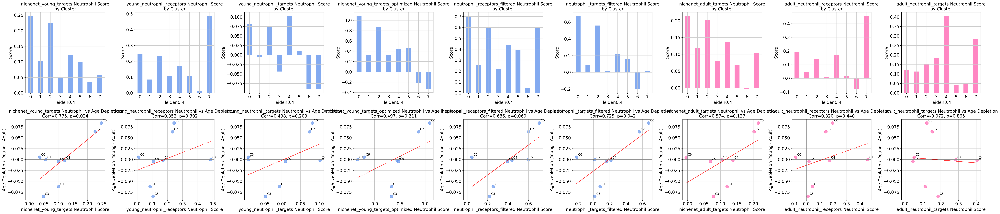

In [157]:
all_scores = young_scores + adult_scores
#all_scores = all_scores[0]
n_scores = len(all_scores)
#n_scores = 1

# Create subplots
fig, axes = plt.subplots(2, n_scores, figsize=(5*n_scores, 10))
if n_scores == 1:
    score = all_scores
    axes = axes.reshape(-1, 1)
    color = my_colors[0] if 'young' in score.lower() else my_colors[1]
    age_group = 'Young' if 'young' in score.lower() else 'Adult'

    # Plot 1: Scores by cluster
    ax1 = axes[0, i]
    cluster_scores[score].plot(kind='bar', ax=ax1, color=color, alpha=0.8)
    ax1.set_title(f'{score} Neutrophil Score\nby Cluster')
    ax1.set_ylabel('Score')
    ax1.tick_params(axis='x', rotation=0)
    
    # Plot 2: Score vs Age Depletion
    ax2 = axes[1, i]
    common_clusters = cluster_scores.index.intersection(age_differences.index)
    
    if len(common_clusters) >= 3:
        x = cluster_scores.loc[common_clusters, score]
        y = age_differences.loc[common_clusters]
        
        ax2.scatter(x, y, alpha=0.7, s=100, color=color)
        
        # Add cluster labels
        for cluster in common_clusters:
            ax2.annotate(f'C{cluster}', 
                       (cluster_scores.loc[cluster, score], age_differences.loc[cluster]),
                       xytext=(5, 5), textcoords='offset points', fontsize=10)
        
        # Fit line
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        ax2.plot(x, p(x), "r--", alpha=0.8)
        
        # Correlation
        corr, p_val = pearsonr(x, y)
        ax2.set_title(f'{score} Neutrophil vs Age Depletion\nCorr={corr:.3f}, p={p_val:.3f}')
        ax2.set_xlabel(f'{score} Neutrophil Score')
        ax2.set_ylabel('Age Depletion (Young - Adult)')
        ax2.axhline(y=0, color='black', linestyle='-', alpha=0.3)
        ax2.axvline(x=0, color='black', linestyle='-', alpha=0.3)

    plt.tight_layout()
    plt.savefig(os.path.join(output_figures, 'age_specific_neutrophil_analysis.png'), dpi=300, bbox_inches='tight')
    plt.show()

for i, score in enumerate(all_scores):
    if n_scores == 1:
        break
    # Determine color based on age group
    color = my_colors[0] if 'young' in score.lower() or 'filtered' in score.lower() else my_colors[1]
    age_group = 'Young' if 'young' in score.lower() else 'Adult'
    
    # Plot 1: Scores by cluster
    ax1 = axes[0, i]
    cluster_scores[score].plot(kind='bar', ax=ax1, color=color, alpha=0.8)
    ax1.set_title(f'{score} Neutrophil Score\nby Cluster')
    ax1.set_ylabel('Score')
    ax1.tick_params(axis='x', rotation=0)
    
    # Plot 2: Score vs Age Depletion
    ax2 = axes[1, i]
    common_clusters = cluster_scores.index.intersection(age_differences.index)
    
    if len(common_clusters) >= 3:
        x = cluster_scores.loc[common_clusters, score]
        y = age_differences.loc[common_clusters]
        
        ax2.scatter(x, y, alpha=0.7, s=100, color=color)
        
        # Add cluster labels
        for cluster in common_clusters:
            ax2.annotate(f'C{cluster}', 
                       (cluster_scores.loc[cluster, score], age_differences.loc[cluster]),
                       xytext=(5, 5), textcoords='offset points', fontsize=10)
        
        # Fit line
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        ax2.plot(x, p(x), "r--", alpha=0.8)
        
        # Correlation
        corr, p_val = pearsonr(x, y)
        ax2.set_title(f'{score} Neutrophil vs Age Depletion\nCorr={corr:.3f}, p={p_val:.3f}')
        ax2.set_xlabel(f'{score} Neutrophil Score')
        ax2.set_ylabel('Age Depletion (Young - Adult)')
        ax2.axhline(y=0, color='black', linestyle='-', alpha=0.3)
        ax2.axvline(x=0, color='black', linestyle='-', alpha=0.3)

plt.tight_layout()
plt.savefig('age_specific_neutrophil_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

In [155]:
all_scores

['nichenet_young_targets',
 'young_neutrophil_receptors',
 'young_neutrophil_targets',
 'nichenet_young_targets_optimized',
 'neutrophil_receptors_filtered',
 'neutrophil_targets_filtered',
 'nichenet_adult_targets',
 'adult_neutrophil_receptors',
 'adult_neutrophil_targets']

In [178]:
score_cols = [col for col in cluster_scores.columns if 'young' in col.lower()]
score_cols += ['neutrophil_receptors_filtered', 'neutrophil_targets_filtered'] 	
age_col='Age'
young_val='< 18 months'
adult_val='> 18 months'
score = 'neutrophil_receptors_filtered'
cluster_col='leiden0.4'

In [135]:
from scipy.stats import ttest_ind

In [168]:
young_mask = adata.obs[age_col] == young_val
adult_mask = adata.obs[age_col] == adult_val

# numeric_cols = ['neutrophil_targets_filtered', 'neutrophil_receptors_filtered']
results = []
young_scores = adata.obs.loc[young_mask, score]
adult_scores = adata.obs.loc[adult_mask, score]

# Mann-Whitney U test (non-parametric)
u_stat, u_pval = mannwhitneyu(young_scores, adult_scores, alternative='two-sided')

# T-test
t_stat, t_pval = ttest_ind(young_scores, adult_scores)

# Effect size (Cohen's d)
pooled_std = np.sqrt(((young_scores.std()**2) * (len(young_scores) - 1) + 
                     (adult_scores.std()**2) * (len(adult_scores) - 1)) / 
                    (len(young_scores) + len(adult_scores) - 2))
cohens_d = (young_scores.mean() - adult_scores.mean()) / pooled_std if pooled_std > 0 else 0

results.append({
    'score': score,
    'young_mean': young_scores.mean(),
    'adult_mean': adult_scores.mean(),
    'difference': young_scores.mean() - adult_scores.mean(),
    'cohens_d': cohens_d,
    'mannwhitney_p': u_pval,
    'ttest_p': t_pval
})

print(f"\n{score}:")
print(f"  Young mean: {young_scores.mean():.4f}")
print(f"  Adult mean: {adult_scores.mean():.4f}")
print(f"  Difference: {young_scores.mean() - adult_scores.mean():+.4f}")
print(f"  Cohen's d: {cohens_d:.3f}")
print(f"  Mann-Whitney p: {u_pval:.4f}")

if u_pval < 0.05:
    direction = "HIGHER" if young_scores.mean() > adult_scores.mean() else "LOWER"
    print(f"  ✓ SIGNIFICANT: {direction} in young patients")
else:
    print(f"  ~ No significant difference")

results_df = pd.DataFrame(results)


neutrophil_receptors_filtered:
  Young mean: 0.6644
  Adult mean: 0.3460
  Difference: +0.3185
  Cohen's d: 0.562
  Mann-Whitney p: 0.0000
  ✓ SIGNIFICANT: HIGHER in young patients


/tmp/ipykernel_3247929/2716589570.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=plot_data, x='Age Group', y='Score', ax=ax1, palette=age_colors)
/tmp/ipykernel_3247929/2716589570.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=plot_data, x='Age Group', y='Score', ax=ax2, palette=age_colors)


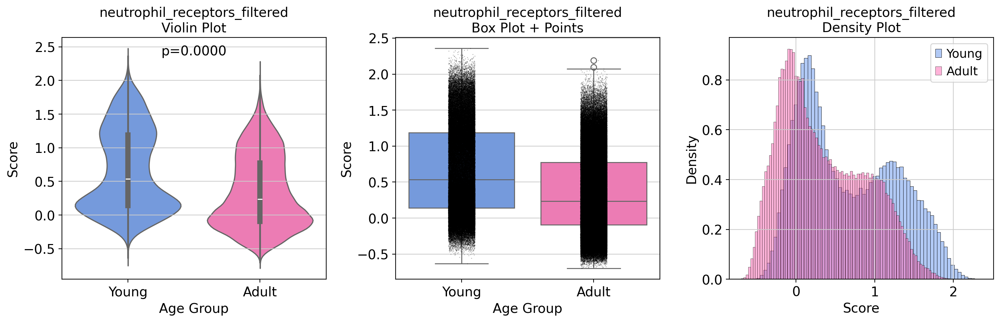

In [169]:
fig = plt.figure(figsize=(15, 5))
age_colors = {'Young': my_colors[0], 'Adult': my_colors[1]}  
ax1 = plt.subplot(1, 3, 1)
        
plot_data = pd.DataFrame({
    'Score': pd.concat([young_scores, adult_scores]),
    'Age Group': ['Young'] * len(young_scores) + ['Adult'] * len(adult_scores)
})

sns.violinplot(data=plot_data, x='Age Group', y='Score', ax=ax1, palette=age_colors)
ax1.set_title(f'{score}\nViolin Plot')

# Add statistical annotation
u_stat, u_pval = mannwhitneyu(young_scores, adult_scores)
ax1.text(0.5, ax1.get_ylim()[1] * 0.9, f'p={u_pval:.4f}', 
        ha='center', transform=ax1.transData)

# Plot 2: Box plot with individual points
ax2 = plt.subplot(1, 3, 2)

sns.boxplot(data=plot_data, x='Age Group', y='Score', ax=ax2, palette=age_colors)
sns.stripplot(data=plot_data, x='Age Group', y='Score', ax=ax2, 
             size=1, alpha=0.3, color='black')
ax2.set_title(f'{score}\nBox Plot + Points')

# Plot 3: Density plot
ax3 = plt.subplot(1, 3, 3)

sns.histplot(young_scores, alpha=0.5, label='Young', ax=ax3, stat='density', color=my_colors[0])
sns.histplot(adult_scores, alpha=0.5, label='Adult', ax=ax3, stat='density', color=my_colors[1])
ax3.legend()
ax3.set_title(f'{score}\nDensity Plot')
ax3.set_xlabel('Score')
    
plt.tight_layout()
plt.savefig(os.path.join(output_figures, 'cell_level_age_comparison.png'), dpi=300, bbox_inches='tight')
plt.show()

/tmp/ipykernel_3247929/130100176.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=plot_data, x='Age Group', y='Score', ax=axes[i], palette=age_colors)
/tmp/ipykernel_3247929/130100176.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=plot_data, x='Age Group', y='Score', ax=axes[i], palette=age_colors)
/tmp/ipykernel_3247929/130100176.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=plot_data, x='Age Group', y='Score', ax=axes[i], palette=age_colors)
/tmp/ipykernel_3247929/130100176.py:23: FutureWarning: 

Passing `p

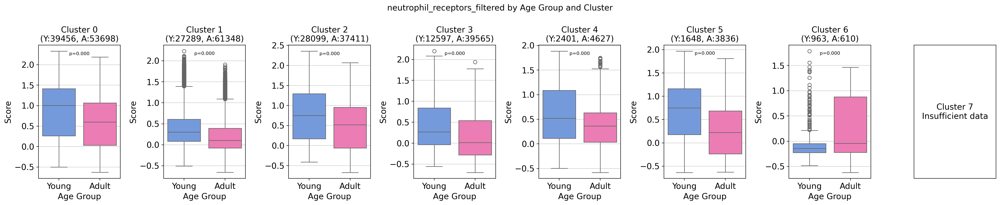

In [170]:
score
clusters = adata.obs[cluster_col].unique()
n_clusters = len(clusters)

fig, axes = plt.subplots(1, n_clusters, figsize=(3 * n_clusters, 5))
if n_clusters == 1:
    axes = [axes]
for i, cluster in enumerate(sorted(clusters)):
    cluster_mask = adata.obs[cluster_col] == cluster
    young_mask = (adata.obs[age_col] == young_val) & cluster_mask
    adult_mask = (adata.obs[age_col] == adult_val) & cluster_mask
    
    if young_mask.sum() > 5 and adult_mask.sum() > 5:  # Minimum cells for comparison
        young_scores = adata.obs.loc[young_mask, score]
        adult_scores = adata.obs.loc[adult_mask, score]
        
        # Create plot data
        plot_data = pd.DataFrame({
            'Score': pd.concat([young_scores, adult_scores]),
            'Age Group': ['Young'] * len(young_scores) + ['Adult'] * len(adult_scores)
        })
        
        sns.boxplot(data=plot_data, x='Age Group', y='Score', ax=axes[i], palette=age_colors)
        axes[i].set_title(f'Cluster {cluster}\n(Y:{young_mask.sum()}, A:{adult_mask.sum()})')
        
        # Add p-value
        if len(young_scores) > 0 and len(adult_scores) > 0:
            try:
                u_stat, u_pval = mannwhitneyu(young_scores, adult_scores)
                axes[i].text(0.5, axes[i].get_ylim()[1] * 0.9, f'p={u_pval:.3f}', 
                           ha='center', transform=axes[i].transData, fontsize=8)
            except:
                pass
    else:
        axes[i].text(0.5, 0.5, f'Cluster {cluster}\nInsufficient data', 
                   ha='center', va='center', transform=axes[i].transAxes)
        axes[i].set_xticks([])
        axes[i].set_yticks([])

plt.suptitle(f'{score} by Age Group and Cluster', fontsize=14)
plt.tight_layout()
plt.savefig(os.path.join(output_figures,'nichenet_score_by_cluster_and_age.png'), dpi=300, bbox_inches='tight')
plt.show()

In [184]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu, ttest_ind
import scanpy as sc

def compare_neutrophil_scores_by_age(adata, age_col='Age', young_val='< 18 months', adult_val='> 18 months', score_cols = score_cols):
    """
    Compare neutrophil interaction scores between young and adult patient cells
    """
    
    print("📊 COMPARING NEUTROPHIL SCORES: Young vs Adult Patients")
    print("=" * 60)
    
    if len(score_cols) == 0:
        print("No neutrophil scores found!")
        return None
    
    print(f"Found {len(score_cols)} neutrophil scores to compare")
    print(f"Age groups: {young_val} vs {adult_val}")
    
    # Check if age column exists
    if age_col not in adata.obs.columns:
        print(f"Age column '{age_col}' not found!")
        return None
    
    # Get age masks
    young_mask = adata.obs[age_col] == young_val
    adult_mask = adata.obs[age_col] == adult_val
    
    print(f"Young patients: {young_mask.sum()} cells")
    print(f"Adult patients: {adult_mask.sum()} cells")
    
    if young_mask.sum() < 10 or adult_mask.sum() < 10:
        print("Warning: Too few cells for comparison!")
        return None
    
    # Statistical comparison
    results = []
    
    for score in score_cols:
        young_scores = adata.obs.loc[young_mask, score]
        adult_scores = adata.obs.loc[adult_mask, score]
        
        # Mann-Whitney U test (non-parametric)
        u_stat, u_pval = mannwhitneyu(young_scores, adult_scores, alternative='two-sided')
        
        # T-test
        t_stat, t_pval = ttest_ind(young_scores, adult_scores)
        
        # Effect size (Cohen's d)
        pooled_std = np.sqrt(((young_scores.std()**2) * (len(young_scores) - 1) + 
                             (adult_scores.std()**2) * (len(adult_scores) - 1)) / 
                            (len(young_scores) + len(adult_scores) - 2))
        cohens_d = (young_scores.mean() - adult_scores.mean()) / pooled_std if pooled_std > 0 else 0
        
        results.append({
            'score': score,
            'young_mean': young_scores.mean(),
            'adult_mean': adult_scores.mean(),
            'difference': young_scores.mean() - adult_scores.mean(),
            'cohens_d': cohens_d,
            'mannwhitney_p': u_pval,
            'ttest_p': t_pval
        })
        
        print(f"\n{score}:")
        print(f"  Young mean: {young_scores.mean():.4f}")
        print(f"  Adult mean: {adult_scores.mean():.4f}")
        print(f"  Difference: {young_scores.mean() - adult_scores.mean():+.4f}")
        print(f"  Cohen's d: {cohens_d:.3f}")
        print(f"  Mann-Whitney p: {u_pval:.4f}")
        
        if u_pval < 0.05:
            direction = "HIGHER" if young_scores.mean() > adult_scores.mean() else "LOWER"
            print(f"  ✓ SIGNIFICANT: {direction} in young patients")
        else:
            print(f"  ~ No significant difference")
    
    results_df = pd.DataFrame(results)
    return results_df

def plot_cell_level_age_comparison(adata, age_col='Age', young_val='< 18 months', adult_val='> 18 months', score_cols=score_cols):
    """
    Create comprehensive plots comparing neutrophil scores by age
    """
    
    if len(score_cols) == 0:
        print("No neutrophil scores to plot!")
        return
    
    n_scores = len(score_cols)
    
    # Create figure with multiple plot types
    fig = plt.figure(figsize=(15, 4 * n_scores))
    
    for i, score in enumerate(score_cols):
        # Extract data
        young_mask = adata.obs[age_col] == young_val
        adult_mask = adata.obs[age_col] == adult_val
        
        young_scores = adata.obs.loc[young_mask, score]
        adult_scores = adata.obs.loc[adult_mask, score]
        
        # Plot 1: Violin plot
        ax1 = plt.subplot(n_scores, 3, i*3 + 1)
        
        plot_data = pd.DataFrame({
            'Score': pd.concat([young_scores, adult_scores]),
            'Age Group': ['Young'] * len(young_scores) + ['Adult'] * len(adult_scores)
        })
        
        sns.violinplot(data=plot_data, x='Age Group', y='Score', ax=ax1)
        ax1.set_title(f'{score}\nViolin Plot')
        
        # Add statistical annotation
        u_stat, u_pval = mannwhitneyu(young_scores, adult_scores)
        ax1.text(0.5, ax1.get_ylim()[1] * 0.9, f'p={u_pval:.4f}', 
                ha='center', transform=ax1.transData)
        
        # Plot 2: Box plot with individual points
        ax2 = plt.subplot(n_scores, 3, i*3 + 2)
        
        sns.boxplot(data=plot_data, x='Age Group', y='Score', ax=ax2)
        sns.stripplot(data=plot_data, x='Age Group', y='Score', ax=ax2, 
                     size=1, alpha=0.3, color='black')
        ax2.set_title(f'{score}\nBox Plot + Points')
        
        # Plot 3: Density plot
        ax3 = plt.subplot(n_scores, 3, i*3 + 3)
        
        sns.histplot(young_scores, alpha=0.5, label='Young', ax=ax3, stat='density')
        sns.histplot(adult_scores, alpha=0.5, label='Adult', ax=ax3, stat='density')
        ax3.legend()
        ax3.set_title(f'{score}\nDensity Plot')
        ax3.set_xlabel('Score')
    
    plt.tight_layout()
    plt.savefig('cell_level_age_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

def plot_age_comparison_by_cluster(adata, cluster_col='leiden0.4', age_col='Age', 
                                  young_val='< 18 months', adult_val='> 18 months', score_cols=score_cols):
    """
    Compare neutrophil scores by age within each cluster
    """
    
    if len(score_cols) == 0:
        print("No scores to plot!")
        return
    
    clusters = adata.obs[cluster_col].unique()
    n_clusters = len(clusters)
    n_scores = len(score_cols)
    
    # Create one plot per score
    for score in score_cols:
        fig, axes = plt.subplots(1, n_clusters, figsize=(3 * n_clusters, 5))
        if n_clusters == 1:
            axes = [axes]
        
        for i, cluster in enumerate(sorted(clusters)):
            cluster_mask = adata.obs[cluster_col] == cluster
            young_mask = (adata.obs[age_col] == young_val) & cluster_mask
            adult_mask = (adata.obs[age_col] == adult_val) & cluster_mask
            
            if young_mask.sum() > 5 and adult_mask.sum() > 5:  # Minimum cells for comparison
                young_scores = adata.obs.loc[young_mask, score]
                adult_scores = adata.obs.loc[adult_mask, score]
                
                # Create plot data
                plot_data = pd.DataFrame({
                    'Score': pd.concat([young_scores, adult_scores]),
                    'Age Group': ['Young'] * len(young_scores) + ['Adult'] * len(adult_scores)
                })
                
                sns.boxplot(data=plot_data, x='Age Group', y='Score', ax=axes[i])
                axes[i].set_title(f'Cluster {cluster}\n(Y:{young_mask.sum()}, A:{adult_mask.sum()})')
                
                # Add p-value
                if len(young_scores) > 0 and len(adult_scores) > 0:
                    try:
                        u_stat, u_pval = mannwhitneyu(young_scores, adult_scores)
                        axes[i].text(0.5, axes[i].get_ylim()[1] * 0.9, f'p={u_pval:.3f}', 
                                   ha='center', transform=axes[i].transData, fontsize=8)
                    except:
                        pass
            else:
                axes[i].text(0.5, 0.5, f'Cluster {cluster}\nInsufficient data', 
                           ha='center', va='center', transform=axes[i].transAxes)
                axes[i].set_xticks([])
                axes[i].set_yticks([])
        
        plt.suptitle(f'{score} by Age Group and Cluster', fontsize=14)
        plt.tight_layout()
        plt.savefig(f'{score}_by_cluster_and_age.png', dpi=300, bbox_inches='tight')
        plt.show()

def comprehensive_age_comparison(adata, cluster_col='leiden0.4', age_col='Age', 
                               young_val='< 18 months', adult_val='> 18 months'):
    """
    Run comprehensive cell-level age comparison analysis
    """
    
    print("🔬 COMPREHENSIVE CELL-LEVEL AGE COMPARISON")
    print("=" * 50)
    
    # Statistical comparison
    results_df = compare_neutrophil_scores_by_age(adata, age_col, young_val, adult_val)
    
    # Overall plots
    plot_cell_level_age_comparison(adata, age_col, young_val, adult_val)
    
    # Cluster-specific plots
    plot_age_comparison_by_cluster(adata, cluster_col, age_col, young_val, adult_val)
    
    # Summary interpretation
    if results_df is not None:
        print("\n🎯 SUMMARY OF CELL-LEVEL DIFFERENCES:")
        print("=" * 40)
        
        significant_results = results_df[results_df['mannwhitney_p'] < 0.05]
        
        for _, row in significant_results.iterrows():
            direction = "HIGHER" if row['difference'] > 0 else "LOWER"
            effect = "Large" if abs(row['cohens_d']) > 0.8 else "Medium" if abs(row['cohens_d']) > 0.5 else "Small"
            
            print(f"{row['score']}:")
            print(f"  {direction} in young patients (d={row['cohens_d']:.3f}, {effect} effect)")
            print(f"  Difference: {row['difference']:+.4f} (p={row['mannwhitney_p']:.4f})")
        
        # Save results
        results_df.to_csv('cell_level_age_comparison_stats.csv', index=False)
        
    return results_df

🔬 COMPREHENSIVE CELL-LEVEL AGE COMPARISON
📊 COMPARING NEUTROPHIL SCORES: Young vs Adult Patients
Found 6 neutrophil scores to compare
Age groups: < 18 months vs > 18 months
Young patients: 112453 cells
Adult patients: 201184 cells

nichenet_young_targets:
  Young mean: 0.2856
  Adult mean: 0.0931
  Difference: +0.1925
  Cohen's d: 0.987
  Mann-Whitney p: 0.0000
  ✓ SIGNIFICANT: HIGHER in young patients

young_neutrophil_receptors:
  Young mean: 0.2285
  Adult mean: 0.1350
  Difference: +0.0935
  Cohen's d: 0.462
  Mann-Whitney p: 0.0000
  ✓ SIGNIFICANT: HIGHER in young patients

young_neutrophil_targets:
  Young mean: 0.1392
  Adult mean: -0.0267
  Difference: +0.1659
  Cohen's d: 0.619
  Mann-Whitney p: 0.0000
  ✓ SIGNIFICANT: HIGHER in young patients

nichenet_young_targets_optimized:
  Young mean: 1.0285
  Adult mean: 0.4703
  Difference: +0.5582
  Cohen's d: 0.547
  Mann-Whitney p: 0.0000
  ✓ SIGNIFICANT: HIGHER in young patients

neutrophil_receptors_filtered:
  Young mean: 0.6644

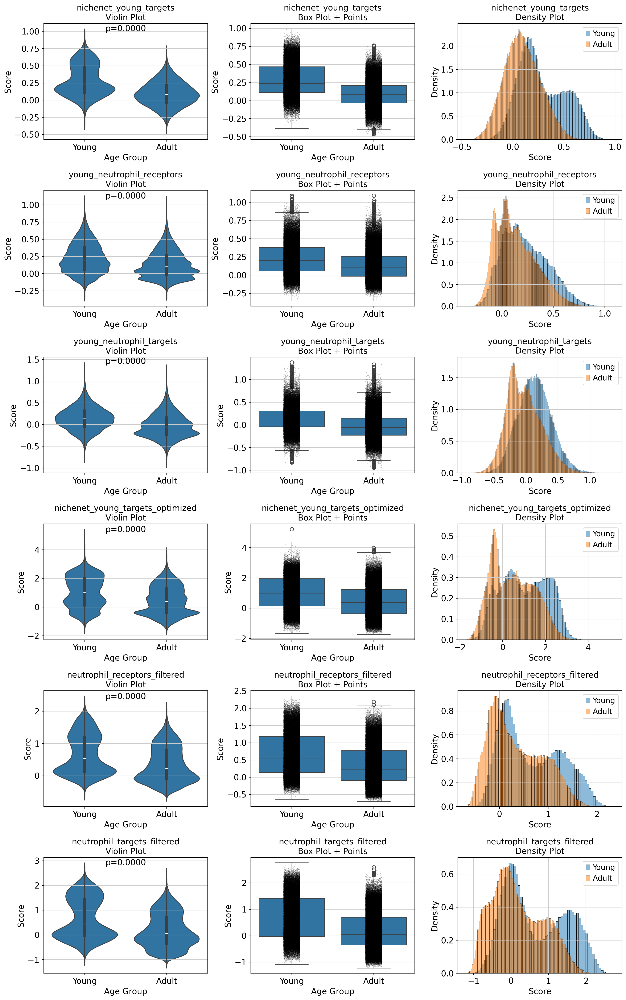

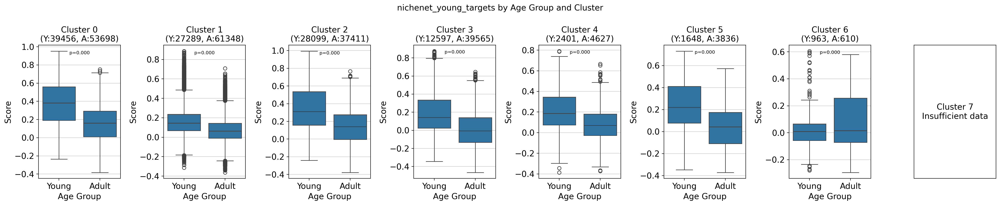

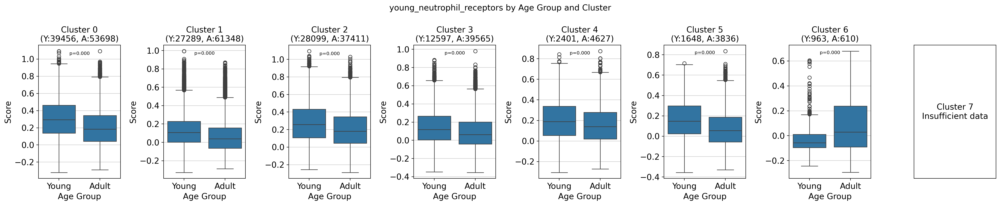

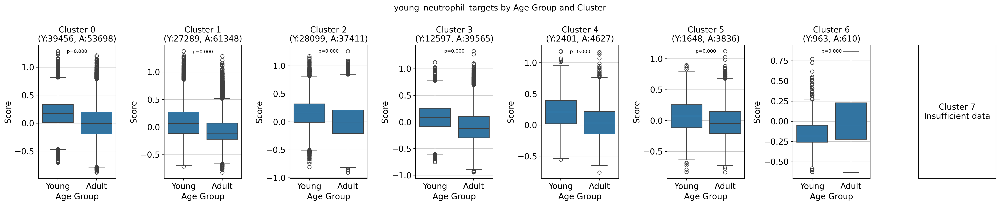

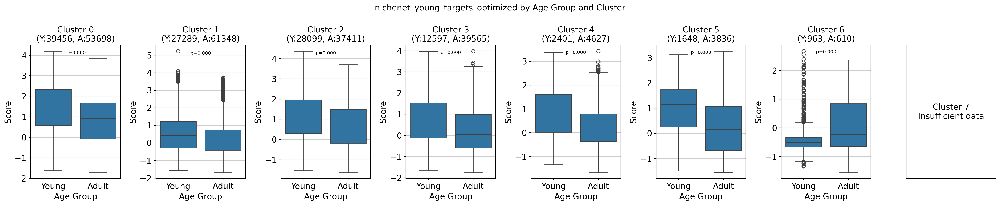

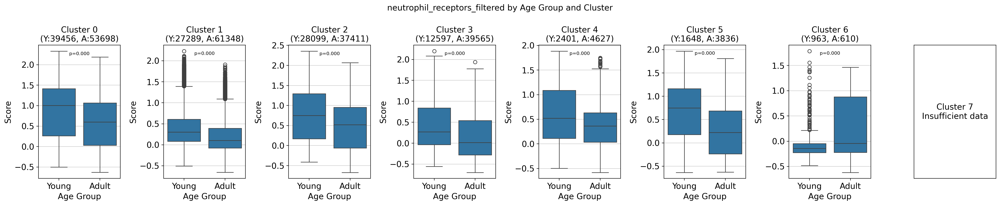

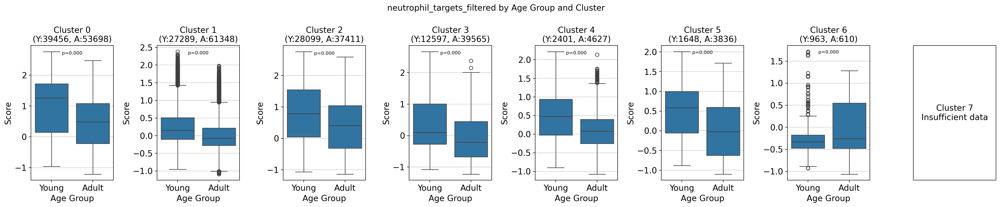


🎯 SUMMARY OF CELL-LEVEL DIFFERENCES:
nichenet_young_targets:
  HIGHER in young patients (d=0.987, Large effect)
  Difference: +0.1925 (p=0.0000)
young_neutrophil_receptors:
  HIGHER in young patients (d=0.462, Small effect)
  Difference: +0.0935 (p=0.0000)
young_neutrophil_targets:
  HIGHER in young patients (d=0.619, Medium effect)
  Difference: +0.1659 (p=0.0000)
nichenet_young_targets_optimized:
  HIGHER in young patients (d=0.547, Medium effect)
  Difference: +0.5582 (p=0.0000)
neutrophil_receptors_filtered:
  HIGHER in young patients (d=0.562, Medium effect)
  Difference: +0.3185 (p=0.0000)
neutrophil_targets_filtered:
  HIGHER in young patients (d=0.667, Medium effect)
  Difference: +0.4889 (p=0.0000)


In [185]:
results = comprehensive_age_comparison(adata)

In [98]:
import pandas as pd
import re

# Load metadata
sample_metadata = pd.read_csv("data/samples_metadata_v5.csv")
sample_metadata.replace("", pd.NA, inplace=True)
sample_metadata.set_index('Sample_dataset', inplace=True)

# Define a function to clean sample IDs
def clean_sample_id(sample_id):
    sample_id = re.sub(r"_rep[12]$", "", sample_id)
    sample_id = re.sub(r"_sn$", "", sample_id)
    sample_id = re.sub(r"_[12]$", "", sample_id)
    return sample_id

# Apply the cleaning function to SampleID in adata.obs
clean_ids = adata.obs['SampleID'].apply(clean_sample_id)

# Extract the Survival column based on the cleaned sample IDs
adata.obs['Survival'] = clean_ids.map(sample_metadata['Survival/Death'])

In [186]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu

def plot_patient_level_scores(adata, score_col='nichenet_young_targets', 
                             patient_col='patient_id', age_col='Age',
                             young_val='< 18 months', adult_val='> 18 months',
                             figsize=(10, 10)):
    """
    Plot average neutrophil scores by patient, sorted by value and colored by age
    """
    
    print(f"📊 Plotting {score_col} by Patient")
    print("=" * 50)
    
    # Check if columns exist
    required_cols = [score_col, patient_col, age_col]
    missing_cols = [col for col in required_cols if col not in adata.obs.columns]
    
    if missing_cols:
        print(f"Missing columns: {missing_cols}")
        print(f"Available columns: {list(adata.obs.columns)}")
        return None
    
    # Calculate patient-level averages
    patient_scores = adata.obs.groupby(patient_col).agg({
        score_col: 'mean',
        age_col: 'first'  # Assuming all cells from same patient have same age
    }).reset_index()
    
    # Filter for the specific age groups
    patient_scores = patient_scores[
        patient_scores[age_col].isin([young_val, adult_val])
    ]
    
    print(f"Found {len(patient_scores)} patients")
    print(f"Young patients: {(patient_scores[age_col] == young_val).sum()}")
    print(f"Adult patients: {(patient_scores[age_col] == adult_val).sum()}")
    
    # Sort by score value
    patient_scores = patient_scores.sort_values(score_col, ascending=True)
    
    # Create color mapping
    colors = {'< 18 months': '#6495EDFF', '> 18 months': '#FF69B4FF'}  # Blue for young, pink for adult
    patient_colors = [colors[age] for age in patient_scores[age_col]]
    
    # Create the plot
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize, height_ratios=[2, 3])
    
    # Main bar plot
    bars = ax1.bar(range(len(patient_scores)), patient_scores[score_col], 
                   color=patient_colors, alpha=0.8, edgecolor='black', linewidth=0.5)
    
    ax1.set_xlabel('Patients (sorted by score)')
    ax1.set_ylabel(f'{score_col.replace("_", " ").title()} Score')
    ax1.set_title(f'Patient-Level {score_col.replace("_", " ").title()} Scores\nSorted by Value, Colored by Age')
    
    # # Add horizontal line at median
    # median_score = patient_scores[score_col].median()
    # ax1.axhline(y=median_score, color='red', linestyle='--', alpha=0.7, label=f'Median = {median_score:.3f}')
    
    # Create legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor=colors[young_val], label=f'Young ({young_val})'),
        Patch(facecolor=colors[adult_val], label=f'Adult ({adult_val})')
    ]
    ax1.legend(handles=legend_elements, loc='upper left')
    
    # Remove x-axis labels (too many patients)
    ax1.set_xticks([])
    
    # Box plot comparison below
    young_scores = patient_scores[patient_scores[age_col] == young_val][score_col]
    adult_scores = patient_scores[patient_scores[age_col] == adult_val][score_col]
    
    box_data = [young_scores, adult_scores]
    box_labels = [f'Young\n(n={len(young_scores)})', f'Adult\n(n={len(adult_scores)})']
    
    bp = ax2.boxplot(box_data, labels=box_labels, patch_artist=True)
    bp['boxes'][0].set_facecolor(colors[young_val])
    bp['boxes'][1].set_facecolor(colors[adult_val])
    
    ax2.set_ylabel('Score')
    ax2.set_title('Distribution Comparison')
    
    # Add statistical test
    if len(young_scores) > 0 and len(adult_scores) > 0:
        u_stat, p_val = mannwhitneyu(young_scores, adult_scores, alternative='two-sided')
        ax2.text(0.5, 0.95, f'Mann-Whitney p = {p_val:.2e}', 
                transform=ax2.transAxes, ha='center', va='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.savefig(f'patient_level_{score_col}.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Print summary statistics
    print(f"\n📈 PATIENT-LEVEL SUMMARY:")
    print("=" * 30)
    print(f"Young patients - Mean: {young_scores.mean():.4f}, Median: {young_scores.median():.4f}, Std: {young_scores.std():.4f}")
    print(f"Adult patients - Mean: {adult_scores.mean():.4f}, Median: {adult_scores.median():.4f}, Std: {adult_scores.std():.4f}")
    print(f"Difference in means: {young_scores.mean() - adult_scores.mean():+.4f}")
    
    if len(young_scores) > 0 and len(adult_scores) > 0:
        u_stat, p_val = mannwhitneyu(young_scores, adult_scores)
        print(f"Mann-Whitney U test p-value: {p_val:.2e}")
    
    # Calculate overlap
    young_range = (young_scores.min(), young_scores.max())
    adult_range = (adult_scores.min(), adult_scores.max())
    overlap_start = max(young_range[0], adult_range[0])
    overlap_end = min(young_range[1], adult_range[1])
    
    if overlap_start < overlap_end:
        print(f"Score overlap range: {overlap_start:.3f} to {overlap_end:.3f}")
    else:
        print("No overlap between age groups!")
    
    return patient_scores

def plot_multiple_scores_by_patient(adata, score_cols=['nichenet_young_targets', 'nichenet_adult_targets'],
                                  patient_col='patient_id', age_col='Age',
                                  young_val='< 18 months', adult_val='> 18 months'):
    """
    Plot multiple scores side by side for comparison
    """
    
    n_scores = len(score_cols)
    fig, axes = plt.subplots(n_scores, 1, figsize=(15, 5*n_scores))
    
    if n_scores == 1:
        axes = [axes]
    
    colors = {'< 18 months': '#6495EDFF', '> 18 months': '#FF69B4FF'}
    
    for i, score_col in enumerate(score_cols):
        # Calculate patient averages
        patient_scores = adata.obs.groupby(patient_col).agg({
            score_col: 'mean',
            age_col: 'first'
        }).reset_index()
        
        # Filter and sort
        patient_scores = patient_scores[
            patient_scores[age_col].isin([young_val, adult_val])
        ].sort_values(score_col, ascending=True)
        
        # Plot
        patient_colors = [colors[age] for age in patient_scores[age_col]]
        axes[i].bar(range(len(patient_scores)), patient_scores[score_col], 
                   color=patient_colors, alpha=0.8, edgecolor='black', linewidth=0.3)
        
        axes[i].set_ylabel(f'{score_col.replace("_", " ").title()}')
        axes[i].set_title(f'Patient-Level {score_col.replace("_", " ").title()}')
        axes[i].set_xticks([])
        
        # Add median line
        median_val = patient_scores[score_col].median()
        axes[i].axhline(y=median_val, color='red', linestyle='--', alpha=0.7)
        
        # Statistics
        young_scores = patient_scores[patient_scores[age_col] == young_val][score_col]
        adult_scores = patient_scores[patient_scores[age_col] == adult_val][score_col]
        
        if len(young_scores) > 0 and len(adult_scores) > 0:
            u_stat, p_val = mannwhitneyu(young_scores, adult_scores)
            mean_diff = young_scores.mean() - adult_scores.mean()
            axes[i].text(0.02, 0.98, f'Δ = {mean_diff:+.3f}\np = {p_val:.2e}', 
                        transform=axes[i].transAxes, va='top',
                        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Add legend to last plot
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor=colors[young_val], label=f'Young ({young_val})'),
        Patch(facecolor=colors[adult_val], label=f'Adult ({adult_val})')
    ]
    axes[-1].legend(handles=legend_elements, loc='lower right')
    axes[-1].set_xlabel('Patients (sorted by score)')
    
    plt.tight_layout()
    plt.savefig('patient_level_multiple_scores.png', dpi=300, bbox_inches='tight')
    plt.show()


print("To plot multiple scores:")
print("plot_multiple_scores_by_patient(adata, ")
print("                               score_cols=['nichenet_young_targets', 'nichenet_adult_targets'])")

To plot multiple scores:
plot_multiple_scores_by_patient(adata, 
                               score_cols=['nichenet_young_targets', 'nichenet_adult_targets'])


📊 Plotting neutrophil_receptors_filtered by Patient
Found 93 patients
Young patients: 36
Adult patients: 57


/tmp/ipykernel_3247929/854330311.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_scores = adata.obs.groupby(patient_col).agg({
/tmp/ipykernel_3247929/854330311.py:82: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax2.boxplot(box_data, labels=box_labels, patch_artist=True)


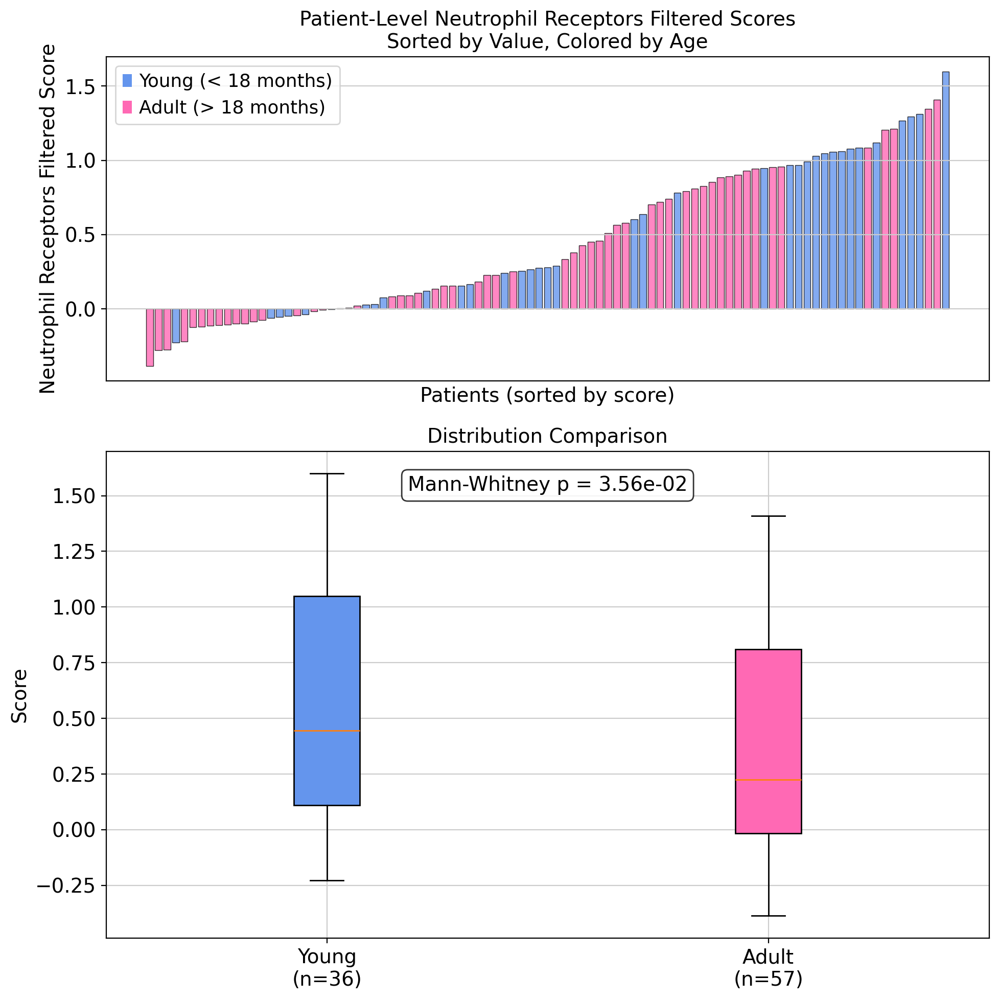


📈 PATIENT-LEVEL SUMMARY:
Young patients - Mean: 0.5721, Median: 0.4456, Std: 0.5201
Adult patients - Mean: 0.3763, Median: 0.2261, Std: 0.4741
Difference in means: +0.1958
Mann-Whitney U test p-value: 3.56e-02
Score overlap range: -0.228 to 1.409


In [187]:
patient_data = plot_patient_level_scores(adata,
                                         score_col=score,
                                         patient_col='SampleID', 
                                         age_col='Age')

In [188]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu

def plot_patient_level_scores(adata, score_col='nichenet_young_targets', 
                             patient_col='patient_id', age_col='Age', survival_col='Survival',
                             young_val='< 18 months', adult_val='> 18 months', dead_val='Death', alive_val='Alive',
                             figsize=(15, 8)):
    """
    Plot average neutrophil scores by patient, sorted by value and colored by age
    Optional: Add survival status markers (✗ for dead patients)
    """
    
    print(f"📊 Plotting {score_col} by Patient")
    if survival_col:
        print(f"Including survival status from column: {survival_col}")
    print("=" * 50)
    
    # Check if columns exist
    required_cols = [score_col, patient_col, age_col]
    if survival_col:
        required_cols.append(survival_col)
    
    missing_cols = [col for col in required_cols if col not in adata.obs.columns]
    
    if missing_cols:
        print(f"Missing columns: {missing_cols}")
        print(f"Available columns: {list(adata.obs.columns)}")
        return None
    
    # Calculate patient-level averages
    agg_dict = {
        score_col: 'mean',
        age_col: 'first'  # Assuming all cells from same patient have same age
    }
    if survival_col:
        agg_dict[survival_col] = 'first'
    
    patient_scores = adata.obs.groupby(patient_col).agg(agg_dict).reset_index()
    
    # Filter for the specific age groups
    patient_scores = patient_scores[
        patient_scores[age_col].isin([young_val, adult_val])
    ]
    
    print(f"Found {len(patient_scores)} patients")
    print(f"Young patients: {(patient_scores[age_col] == young_val).sum()}")
    print(f"Adult patients: {(patient_scores[age_col] == adult_val).sum()}")
    
    if survival_col:
        dead_patients = (patient_scores[survival_col] == dead_val).sum()
        alive_patients = (patient_scores[survival_col] == alive_val).sum()
        print(f"Dead patients: {dead_patients}")
        print(f"Alive patients: {alive_patients}")
    
    # Sort by score value
    patient_scores = patient_scores.sort_values(score_col, ascending=True)
    patient_scores = patient_scores.reset_index(drop=True)  # Reset index for proper positioning
    
    # Create color mapping
    colors = {'< 18 months': '#6495EDFF', '> 18 months': '#FF69B4FF'}  # Blue for young, pink for adult
    patient_colors = [colors[age] for age in patient_scores[age_col]]
    
    # Create the plot
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize, height_ratios=[3, 1])
    
    # Main bar plot
    bars = ax1.bar(range(len(patient_scores)), patient_scores[score_col], 
                   color=patient_colors, alpha=0.8, edgecolor='black', linewidth=0.5)
    
    # Add death markers if survival data is available
    if survival_col:
        dead_mask = patient_scores[survival_col] == dead_val
        if dead_mask.sum() > 0:
            # Get positions and heights for dead patients
            dead_positions = np.where(dead_mask)[0]
            dead_heights = patient_scores.loc[dead_mask, score_col].values
            
            # Add markers on top of bars for dead patients
            for pos, height in zip(dead_positions, dead_heights):
                ax1.scatter(pos, height + (ax1.get_ylim()[1] - ax1.get_ylim()[0]) * 0.02, 
                           marker='x', s=100, c='red', linewidth=3, zorder=10)
    
    ax1.set_xlabel('Patients (sorted by score)')
    ax1.set_ylabel(f'{score_col.replace("_", " ").title()} Score')
    ax1.set_title(f'Patient-Level {score_col.replace("_", " ").title()} Scores\nSorted by Value, Colored by Age')
    
    # Add horizontal line at median
    median_score = patient_scores[score_col].median()
    ax1.axhline(y=median_score, color='red', linestyle='--', alpha=0.7, label=f'Median = {median_score:.3f}')
    
    # Create legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor=colors[young_val], label=f'Young ({young_val})'),
        Patch(facecolor=colors[adult_val], label=f'Adult ({adult_val})')
    ]
    
    # Add death marker to legend if survival data is available
    if survival_col and (patient_scores[survival_col] == dead_val).sum() > 0:
        from matplotlib.lines import Line2D
        legend_elements.append(
            Line2D([0], [0], marker='x', color='red', linewidth=0, 
                   markersize=10, markerfacecolor='red', markeredgewidth=3,
                   label=f'Dead ({dead_val})')
        )
    
    ax1.legend(handles=legend_elements, loc='upper left')
    
    # Remove x-axis labels (too many patients)
    ax1.set_xticks([])
    
    # Box plot comparison below
    young_scores = patient_scores[patient_scores[age_col] == young_val][score_col]
    adult_scores = patient_scores[patient_scores[age_col] == adult_val][score_col]
    
    box_data = [young_scores, adult_scores]
    box_labels = [f'Young\n(n={len(young_scores)})', f'Adult\n(n={len(adult_scores)})']
    
    bp = ax2.boxplot(box_data, labels=box_labels, patch_artist=True)
    bp['boxes'][0].set_facecolor(colors[young_val])
    bp['boxes'][1].set_facecolor(colors[adult_val])
    
    ax2.set_ylabel('Score')
    ax2.set_title('Distribution Comparison')
    
    # Add statistical test
    if len(young_scores) > 0 and len(adult_scores) > 0:
        u_stat, p_val = mannwhitneyu(young_scores, adult_scores, alternative='two-sided')
        ax2.text(0.5, 0.95, f'Mann-Whitney p = {p_val:.2e}', 
                transform=ax2.transAxes, ha='center', va='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.savefig(f'patient_level_{score_col}.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Print summary statistics
    print(f"\n📈 PATIENT-LEVEL SUMMARY:")
    print("=" * 30)
    print(f"Young patients - Mean: {young_scores.mean():.4f}, Median: {young_scores.median():.4f}, Std: {young_scores.std():.4f}")
    print(f"Adult patients - Mean: {adult_scores.mean():.4f}, Median: {adult_scores.median():.4f}, Std: {adult_scores.std():.4f}")
    print(f"Difference in means: {young_scores.mean() - adult_scores.mean():+.4f}")
    
    if len(young_scores) > 0 and len(adult_scores) > 0:
        u_stat, p_val = mannwhitneyu(young_scores, adult_scores)
        print(f"Mann-Whitney U test p-value: {p_val:.2e}")
    
    # Survival analysis if available
    if survival_col:
        print(f"\n💀 SURVIVAL ANALYSIS:")
        print("=" * 20)
        
        dead_mask = patient_scores[survival_col] == dead_val
        alive_mask = patient_scores[survival_col] == alive_val
        
        if dead_mask.sum() > 0 and alive_mask.sum() > 0:
            dead_scores = patient_scores[dead_mask][score_col]
            alive_scores = patient_scores[alive_mask][score_col]
            
            print(f"Dead patients - Mean: {dead_scores.mean():.4f}, Median: {dead_scores.median():.4f}")
            print(f"Alive patients - Mean: {alive_scores.mean():.4f}, Median: {alive_scores.median():.4f}")
            print(f"Difference (Alive - Dead): {alive_scores.mean() - dead_scores.mean():+.4f}")
            
            # Statistical test
            u_stat_surv, p_val_surv = mannwhitneyu(alive_scores, dead_scores)
            print(f"Survival Mann-Whitney p-value: {p_val_surv:.2e}")
            
            if p_val_surv < 0.05:
                if alive_scores.mean() > dead_scores.mean():
                    print("✓ SIGNIFICANT: Higher scores associated with better survival!")
                else:
                    print("✓ SIGNIFICANT: Lower scores associated with better survival!")
            else:
                print("~ No significant association with survival")
            
            # Cross-tabulation: Age vs Survival
            print(f"\n📊 AGE vs SURVIVAL:")
            young_dead = patient_scores[(patient_scores[age_col] == young_val) & dead_mask].shape[0]
            young_alive = patient_scores[(patient_scores[age_col] == young_val) & alive_mask].shape[0]
            adult_dead = patient_scores[(patient_scores[age_col] == adult_val) & dead_mask].shape[0]
            adult_alive = patient_scores[(patient_scores[age_col] == adult_val) & alive_mask].shape[0]
            
            if young_alive + young_dead > 0:
                young_survival_rate = young_alive / (young_alive + young_dead) * 100
            else:
                young_survival_rate = 0
                
            if adult_alive + adult_dead > 0:
                adult_survival_rate = adult_alive / (adult_alive + adult_dead) * 100
            else:
                adult_survival_rate = 0
            
            print(f"Young patients: {young_survival_rate:.1f}% survival ({young_alive}/{young_alive + young_dead})")
            print(f"Adult patients: {adult_survival_rate:.1f}% survival ({adult_alive}/{adult_alive + adult_dead})")
    
    # Calculate overlap
    young_range = (young_scores.min(), young_scores.max())
    adult_range = (adult_scores.min(), adult_scores.max())
    overlap_start = max(young_range[0], adult_range[0])
    overlap_end = min(young_range[1], adult_range[1])
    
    if overlap_start < overlap_end:
        print(f"\nScore overlap range: {overlap_start:.3f} to {overlap_end:.3f}")
    else:
        print("\nNo overlap between age groups!")
    
    return patient_scores

📊 Plotting neutrophil_receptors_filtered by Patient
Including survival status from column: Survival
Found 93 patients
Young patients: 36
Adult patients: 57
Dead patients: 4
Alive patients: 43


/tmp/ipykernel_3247929/1128685933.py:41: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_scores = adata.obs.groupby(patient_col).agg(agg_dict).reset_index()
/tmp/ipykernel_3247929/1128685933.py:122: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax2.boxplot(box_data, labels=box_labels, patch_artist=True)


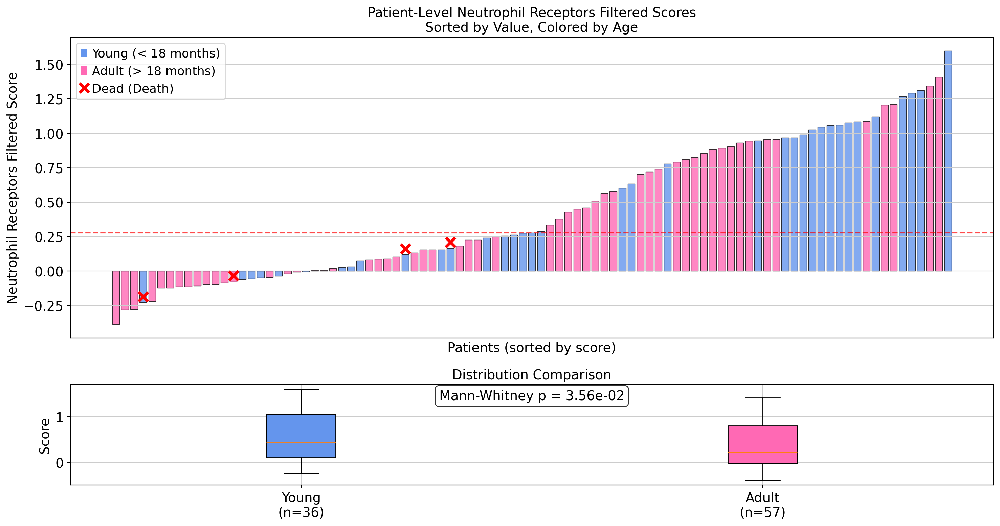


📈 PATIENT-LEVEL SUMMARY:
Young patients - Mean: 0.5721, Median: 0.4456, Std: 0.5201
Adult patients - Mean: 0.3763, Median: 0.2261, Std: 0.4741
Difference in means: +0.1958
Mann-Whitney U test p-value: 3.56e-02

💀 SURVIVAL ANALYSIS:
Dead patients - Mean: -0.0046, Median: 0.0219
Alive patients - Mean: 0.4455, Median: 0.1569
Difference (Alive - Dead): +0.4501
Survival Mann-Whitney p-value: 1.96e-01
~ No significant association with survival

📊 AGE vs SURVIVAL:
Young patients: 86.4% survival (19/22)
Adult patients: 96.0% survival (24/25)

Score overlap range: -0.228 to 1.409


In [189]:
patient_data = plot_patient_level_scores(adata, 
                                        score_col=score,
                                        patient_col='SampleID',
                                        age_col='Age',
                                        survival_col='Survival',  # adjust column name
                                        dead_val='Death',
                                        alive_val='Survival')

Total young patients: 112453
Young patients with survival data: 60857
Removed 51596 patients with missing survival data

Survival categories:
Survival
Survival    54748
Death        6109
Name: count, dtype: int64

Patient-level summary:
Total young patients: 93
Survival
Survival    19
Death        3
Name: count, dtype: int64

Alive patients: 19
Dead patients: 3


/tmp/ipykernel_3247929/3500458928.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  young_patient_scores = young_data_clean.groupby('SampleID').agg({
/tmp/ipykernel_3247929/3500458928.py:41: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box_data, labels=box_labels, patch_artist=True)


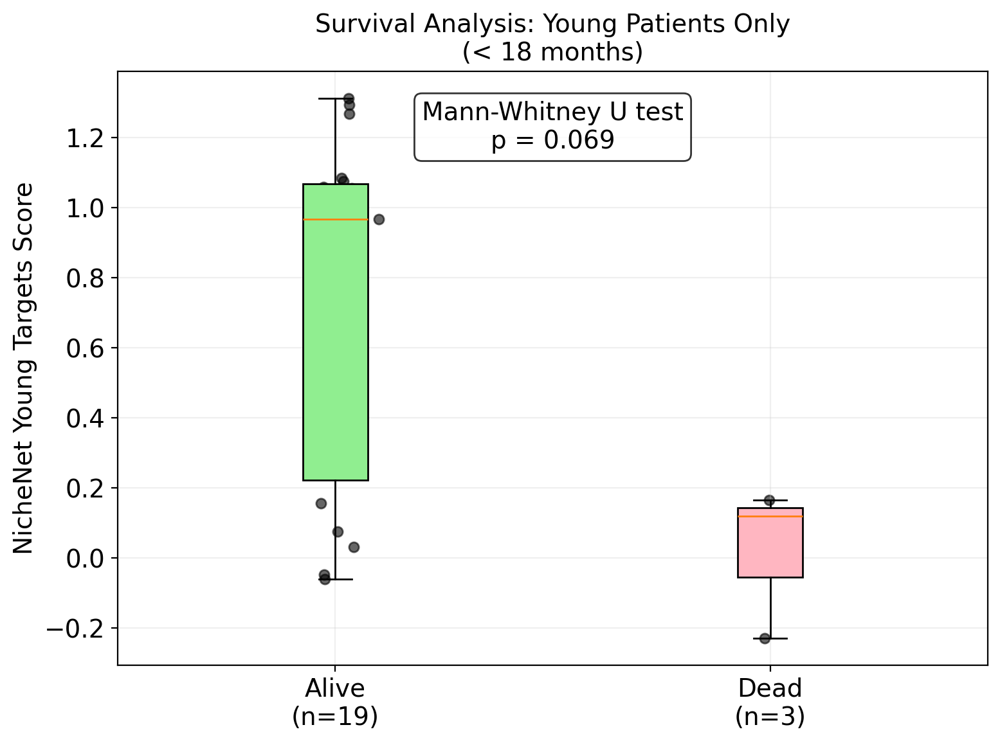


📊 STATISTICAL SUMMARY:
Alive patients:
  Mean: 0.7547
  Median: 0.9685
  Std: 0.4955
  Range: -0.0601 - 1.3134

Dead patients:
  Mean: 0.0195
  Median: 0.1206
  Std: 0.2155
  Range: -0.2279 - 0.1658

Difference in means (Alive - Dead): +0.7352
Mann-Whitney U test p-value: 0.0688
~ No significant association with survival


/tmp/ipykernel_3247929/3500458928.py:98: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=young_patient_scores, x='Survival', y=score,


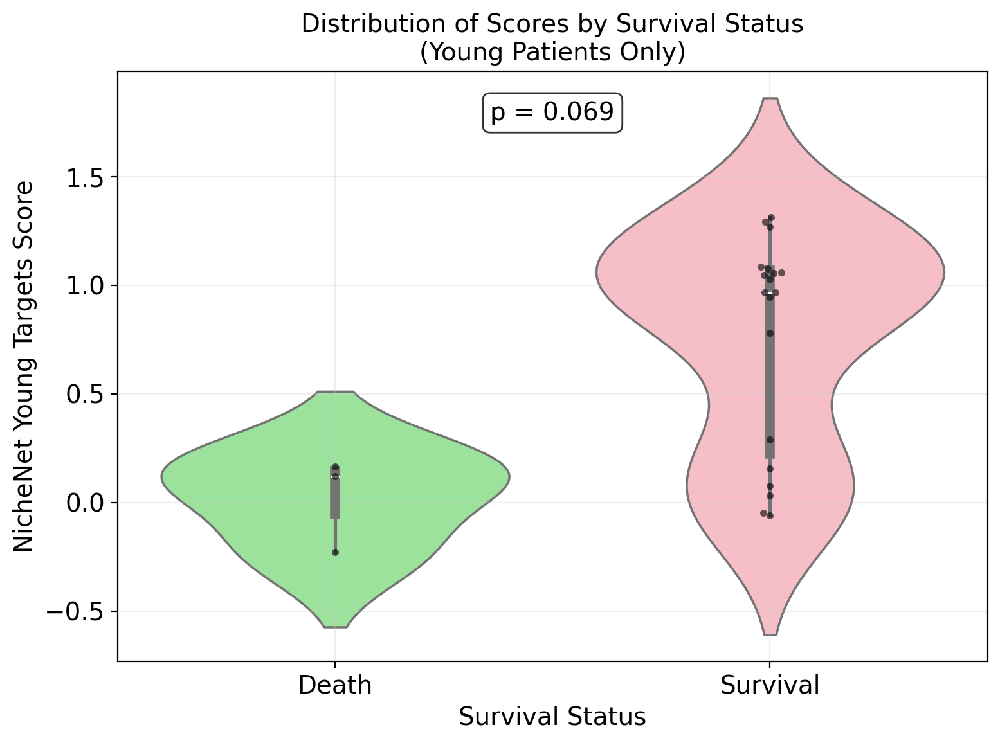


📋 PATIENT-LEVEL DATA:
                SampleID  neutrophil_receptors_filtered  Survival
27  HTAPP_126_patel_rep1                       1.313357  Survival
28  HTAPP_126_patel_rep2                       1.293527  Survival
41  HTAPP_204_patel_rep1                       1.268948  Survival
22  HTAPP_120_patel_rep1                       1.084981  Survival
17  HTAPP_102_patel_rep2                       1.076844  Survival
..                   ...                            ...       ...
86         Tumor_69_dong                            NaN       NaN
89         Tumor_92_dong                            NaN       NaN
90        Tumor_162_dong                            NaN       NaN
91        Tumor_200_dong                            NaN       NaN
92        Tumor_230_dong                            NaN       NaN

[93 rows x 3 columns]


In [198]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu

# Filter for young patients only and remove NA values in survival
young_data = adata.obs[adata.obs['Age'] == '< 18 months'].copy()
young_data_clean = young_data.dropna(subset=['Survival'])

print(f"Total young patients: {len(young_data)}")
print(f"Young patients with survival data: {len(young_data_clean)}")
print(f"Removed {len(young_data) - len(young_data_clean)} patients with missing survival data")

# Check survival categories
print(f"\nSurvival categories:")
print(young_data_clean['Survival'].value_counts())

# Calculate patient-level averages for young patients
young_patient_scores = young_data_clean.groupby('SampleID').agg({
    score: 'mean',
    'Survival': 'first'  # All cells from same patient should have same survival
}).reset_index()

print(f"\nPatient-level summary:")
print(f"Total young patients: {len(young_patient_scores)}")
print(young_patient_scores['Survival'].value_counts())

# Separate by survival status
alive_scores = young_patient_scores[young_patient_scores['Survival'] == 'Survival'][score]
dead_scores = young_patient_scores[young_patient_scores['Survival'] == 'Death'][score]

print(f"\nAlive patients: {len(alive_scores)}")
print(f"Dead patients: {len(dead_scores)}")

# Create boxplot
plt.figure(figsize=(8, 6))
box_data = [alive_scores, dead_scores]
box_labels = [f'Alive\n(n={len(alive_scores)})', f'Dead\n(n={len(dead_scores)})']

bp = plt.boxplot(box_data, labels=box_labels, patch_artist=True)
bp['boxes'][0].set_facecolor('#90EE90')  # Light green for alive
bp['boxes'][1].set_facecolor('#FFB6C1')  # Light pink for dead

plt.ylabel('NicheNet Young Targets Score')
plt.title('Survival Analysis: Young Patients Only\n(< 18 months)')
plt.grid(True, alpha=0.3)

# Add individual points
for i, scores in enumerate([alive_scores, dead_scores]):
    x = np.random.normal(i+1, 0.04, size=len(scores))
    plt.scatter(x, scores, alpha=0.6, s=30, color='black')

# Statistical test
if len(alive_scores) > 0 and len(dead_scores) > 0:
    u_stat, p_val = mannwhitneyu(alive_scores, dead_scores, alternative='two-sided')
    
    # Add p-value to plot
    plt.text(0.5, 0.95, f'Mann-Whitney U test\np = {p_val:.3f}', 
             transform=plt.gca().transAxes, ha='center', va='top',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.savefig(os.path.join(output_figures, 'young_patients_survival_boxplot.png'), dpi=300, bbox_inches='tight')
plt.show()

# Print detailed statistics
print(f"\n📊 STATISTICAL SUMMARY:")
print("=" * 30)
print(f"Alive patients:")
print(f"  Mean: {alive_scores.mean():.4f}")
print(f"  Median: {alive_scores.median():.4f}")
print(f"  Std: {alive_scores.std():.4f}")
print(f"  Range: {alive_scores.min():.4f} - {alive_scores.max():.4f}")

print(f"\nDead patients:")
print(f"  Mean: {dead_scores.mean():.4f}")
print(f"  Median: {dead_scores.median():.4f}")
print(f"  Std: {dead_scores.std():.4f}")
print(f"  Range: {dead_scores.min():.4f} - {dead_scores.max():.4f}")

print(f"\nDifference in means (Alive - Dead): {alive_scores.mean() - dead_scores.mean():+.4f}")

if len(alive_scores) > 0 and len(dead_scores) > 0:
    u_stat, p_val = mannwhitneyu(alive_scores, dead_scores, alternative='two-sided')
    print(f"Mann-Whitney U test p-value: {p_val:.4f}")
    
    if p_val < 0.05:
        if alive_scores.mean() > dead_scores.mean():
            print("✓ SIGNIFICANT: Higher scores associated with better survival!")
        else:
            print("✓ SIGNIFICANT: Lower scores associated with worse survival!")
    else:
        print("~ No significant association with survival")

# Additional violin plot for better visualization
plt.figure(figsize=(8, 6))
sns.violinplot(data=young_patient_scores, x='Survival', y=score, 
               palette=['#90EE90', '#FFB6C1'])
sns.swarmplot(data=young_patient_scores, x='Survival', y=score, 
              color='black', alpha=0.6, size=4)

plt.ylabel('NicheNet Young Targets Score')
plt.xlabel('Survival Status')
plt.title('Distribution of Scores by Survival Status\n(Young Patients Only)')
plt.grid(True, alpha=0.3)

# Add statistics to violin plot
if len(alive_scores) > 0 and len(dead_scores) > 0:
    plt.text(0.5, 0.95, f'p = {p_val:.3f}', 
             transform=plt.gca().transAxes, ha='center', va='top',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.savefig(os.path.join(output_figures, 'young_patients_survival_violin.png'), dpi=300, bbox_inches='tight')
plt.show()

# Show the patient-level data
print(f"\n📋 PATIENT-LEVEL DATA:")
print("=" * 30)
print(young_patient_scores.sort_values(score, ascending=False))

In [111]:
young_patient_scores[young_patient_scores['Survival'] == 'Death']

,SampleID,nichenet_young_targets,Survival
48,M264AAB_T_wienke,0.060446,Death
53,M993AAA_T1_wienke,-0.323344,Death
87,Tumor_71_dong,0.212563,Death


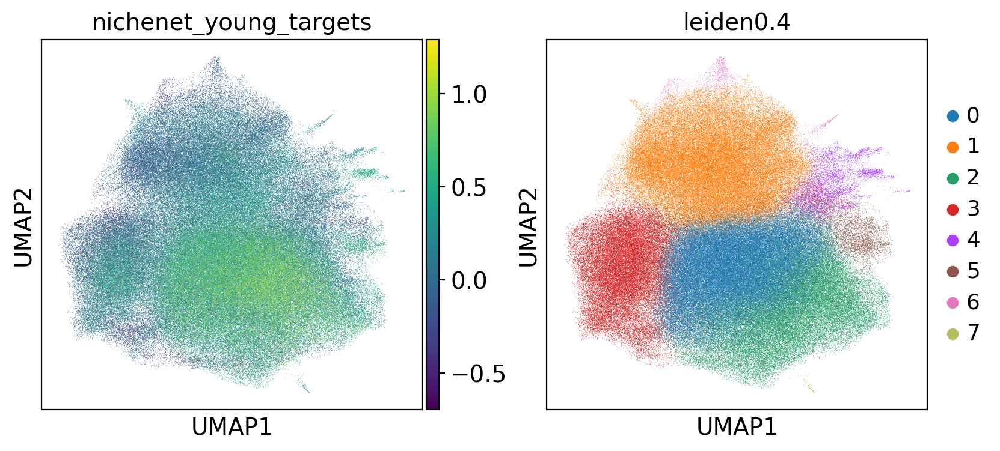

In [61]:
sc.pl.umap(adata, color=['nichenet_young_targets', 'leiden0.4'])